<a href="https://colab.research.google.com/github/micael-oliveira-ufam/bergenin_P2Y_P2X_in_diabetic_neuropathy/blob/main/Article_ACS_Docking_and_molecular_dynamics_of_bergenin_and_their_derivates_on_interaction_with_P2Y_and_P2X_in_treatment_of_diabetic_neuropathy.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

---
#Molecular docking notebook protocols of bergenin and derivatives inhibiting P2X and P2Y purinergic receptors in blood coagulation signaling and the Aldolase Reductase pathway
---

**Authors:**  Fabiano Sousa Barbosa <sup>1</sup>, Ana Cristina, Micael D. L. Oliveira <sup>1</sup>, Kelson M. T. Oliveira <sup>2</sup>, Emersom Silva Lima <sup>1</sup>. \\
<sup>1</sup> Faculty of Pharmaceutical Sciences, Federal University of Amazonas, 69077-000, Manaus, Amazonas, Brazil; \\
<sup>1</sup> Department of Chemistry, Federal University of Amazonas, 69077-000, Manaus, Amazonas, Brazil. \\
*E-mail: eslima@ufam.edu.br

Notebook written on December 04, 2023 by Micael D. L. Oliveira. \\
Notebook updated on March 11, 2025 by Micael D. L. Oliveira.



## The importance of molecular docking

Molecular docking algorithms perform a search for the most energetically favorable conformations of how a compound, drug or future medication will fit into the receptor site. Among the best-known docking algorithms, we have AutoDock, whose first version was published in 1996. Since then, it has received several updates over time, the most recent being AutoDock Vina 1.2.5, which was published in 2021, and the current version from May 2023. Over time, and with the advancement of computing, different algorithms have been implemented, the most current being Monte Carlo optimization. This is because it is computationally impossible to address all the trillions of possible conformations of the medication when interacting at the receptor site, which is why we are looking for increasingly better and more precise algorithms that accelerate this search.

The corresponding scientific article for the 2021 AutoDock Vina v.1.2.5 publication can be found at:

Eberhardt, J., Santos-Martins, D., Tillack, A. F. & Forli, S. AutoDock Vina 1.2.0: New Docking Methods, Expanded Force Field, and Python Bindings. Journal of Chemical Information and Modeling vol. 61 3891–3898 (2021). https://pubs.acs.org/doi/10.1021/acs.jcim.1c00203

The first article of this software was published in 2009, employing a genetic search algorithm:

Trott, O. & Olson, A. J. AutoDock Vina: Improving the speed and accuracy of docking with a new scoring function, efficient optimization, and multithreading. Journal of Computational Chemistry vol. 31 455–461 (2009). https://onlinelibrary.wiley.com/doi/10.1002/jcc.21334 The adopted protocols are in accordance with the article published by the AutoDock developers themselves, at the Scripps Research Institute where the AutoDock package was built: https://www.nature.com/articles/nprot.2016.051

---
# What molecular docking software programs are available?

Among the main and most consolidated ones are AutoDock Vina and CCSD Gold. This lab notebook was created with Vina docking in mind, but the same logic applies to GOLD. It is important to note that each algorithm will have its own scoring function, and consequently will have different affinities. Therefore, the score obtained is always **qualitative** and not quantitative, as is often said.

A concept in Physical Chemistry that is essential to understanding molecular docking is Gibbs free energy, which indicates the spontaneity of drug-receptor interaction. Therefore, the more negative the result, the more promising the affinity, and therefore favorable to the interaction. This variable will depend mainly on the electrostatic interactions between the atoms.

If you want to do the docking on your own computer, instead of in the cloud, as is the case with this platform. Some software is very important:

AutoDock Tools v.1.5.7 (2013): https://ccsb.scripps.edu/mgltools/downloads/

This first software does not perform docking, but only prepares ligands and receptor. While Vina is the one that actually does the docking simulation, but does not have a graphical interface.

AutoDock Vina v.1.2.5 (2023): https://github.com/ccsb-scripps/AutoDock-Vina/releases/download/v1.2.5/vina_1.2.5_win.exe

\\
Meanwhile, the CCSD package that includes the GOLD molecular docking software can be obtained for free with an original license at the link:

https://bdec.dotlib.com.br/

### Tutorial on how this electronic laboratory notebook works

This notebook was created to enable everyone here in the BioPhar laboratory to run docking simulations on their own on a single platform without having to install multiple software for each step, from preparation to the docking itself and its respective analyses.

It works relatively simply; just press the "Play" button on each cell to execute the command:

However, some software is essential, such as Discovery Studio 2021 for constructing the chemical interaction diagram after molecular docking is completed, as well as

In [ ]:
#@title **Montagem do Google drive para salvar os resultados e download do pacote Conda**

print("Montando pasta no Google Drive para salvar ...")
from google.colab import drive
drive.mount('/content/drive')

print("Instalação da biblioteca Conda para o Google Colab necessária para a execução dos cálculos ...")
!pip3 install -q condacolab
import condacolab
condacolab.install()
#condacolab.install(channels=["conda-forge", "bioconda"])

import sys
sys.path.append('/usr/local/lib/python3.10/site-packages/')
print("Instalação das principais bibliotecas com sucesso.")

Montando pasta no Google Drive para salvar ...
Mounted at /content/drive
Instalação da biblioteca Conda para o Google Colab necessária para a execução dos cálculos ...
⏬ Downloading https://github.com/jaimergp/miniforge/releases/download/24.11.2-1_colab/Miniforge3-colab-24.11.2-1_colab-Linux-x86_64.sh...
📦 Installing...
📌 Adjusting configuration...
🩹 Patching environment...
⏲ Done in 0:00:17
🔁 Restarting kernel...
Instalação das principais bibliotecas com sucesso.


In [ ]:
#@title **Instalação das bibliotecas necessárias para o docking molecular**

#O código utilizado tenta tornar mais amigável a interface de instalação das bibliotecas, mas por algum motivo os comandos não consegues ser executados

%%time
import os
import subprocess

print("Instalando AutoDock Tools v.1.5.7...")
os.system("conda install -c bioconda mgltools openbabel pdbfixer") # version of OpenBabel is 3.1.1
#!conda install -c hcc adfr-suite
#!conda config --env --add channels conda-forge
#!conda install -c conda-forge openbabel # Version of OpenBabel is 3.1.1

print("Instalação da biblioteca Meeko para preparação de ligantes...")
os.system("pip3 install meeko kora py3Dmol")
os.system("pip3 install rdkit pubchempy scipy pandas openbabel")

print("Instalação das bibliotecas para visualização e download de proteínas/receptores...")
os.system("pip3 install Py3Dmol nglview requests")

print("Instalando AutoDock Vina v.1.2.5...")
os.system("pip3 install vina numpy") # versão atual do Vina v.1.2.5 (2023)
#!conda install -c conda-forge vina # Versão antiga do Vina v.1.1.2 (2011)

Instalando AutoDock Tools v.1.5.7...
Instalação da biblioteca Meeko para preparação de ligantes...
Instalação das bibliotecas para visualização e download de proteínas/receptores...
Instalando AutoDock Vina v.1.2.5...
CPU times: user 839 ms, sys: 109 ms, total: 948 ms
Wall time: 3min 4s


256

###Preparação do receptor via Python

Inicialmente as coordenadas do sítio de ligação dos receptores estão sendo obtidas pelo AutoDock Tools. Desta forma, primeiramente houve a remoção do ligante presente na cristalografia proveniente do Protein Data Bank e depois como se fosse um "receptor", foi descoberto seu centro de massa que será justamente o sítio do receptor. Contudo, ao realizar o cálculo do centro de massa por outras ferramentas integradas ao Python, as coordenadas diferem entre si.

No momento, a etapa de preparação dos receptores e ligantes foi realizada manualmente ao invés de automatizada com scripts em Python. Vem sendo utilizado na preparação dos receptores o Schrodinger Maestro 2023-1, para adição de Hidrogênios e minimização estrutural, além do AutoDock Tools para conversão do formato .pdb para .pdbqt já atribuindo as cargar parciais.

In [ ]:
#@title **Estrutrura tridimensional do receptor P2Y12 (PDB ID: 4NTJ)**

import py3Dmol
import requests

# Define the PDB ID of the protein you want to visualize
pdb_id = "4NTJ" #@param {type:"string"}


# Fetch the PDB file for the specified PDB ID
pdb_url = f"https://files.rcsb.org/download/{pdb_id}.pdb"
response = requests.get(pdb_url)

if response.status_code == 200:
    pdb_data = response.text
else:
    raise Exception(f"Failed to fetch PDB data for PDB ID {pdb_id}")

# Create a Py3Dmol view and visualize the protein structure
viewer = py3Dmol.view(width=600, height=600)
viewer.addModel(pdb_data, "pdb")

# Style the visualization (optional)
viewer.setStyle({"cartoon": {'color':'spectrum'}})
viewer.zoomTo()
viewer.show()

#Salvar arquivo .pdb...
!wget https://files.rcsb.org/download/{pdb_id.upper()}.pdb -O {pdb_id}

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

In [ ]:
#@title **Estrutrura tridimensional do receptor P2Y12 (PDB ID: 7PP1)**

import py3Dmol
import requests

%cd /content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/Docking molecular/Receptors

# Define the PDB ID of the protein you want to visualize
pdb_id = "7PP1" #@param {type:"string"}

# Fetch the PDB file for the specified PDB ID
pdb_url = f"https://files.rcsb.org/download/{pdb_id}.cif"
response = requests.get(pdb_url)

if response.status_code == 200:
    pdb_data = response.text
else:
    raise Exception(f"Failed to fetch PDB data for PDB ID {pdb_id}")

# Create a Py3Dmol view and visualize the protein structure
viewer = py3Dmol.view(width=600, height=600)
viewer.addModel(pdb_data, "cif")

# Style the visualization (optional)
viewer.setStyle({"cartoon": {'color':'spectrum'}})
viewer.zoomTo()
viewer.show()

#Salvar arquivo .pdb...
!wget https://files.rcsb.org/download/{pdb_id.upper()}.cif -O {pdb_id}

/content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/Docking molecular/Receptors


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

--2024-05-16 04:45:44--  https://files.rcsb.org/download/7PP1.cif
Resolving files.rcsb.org (files.rcsb.org)... 128.6.159.157
Connecting to files.rcsb.org (files.rcsb.org)|128.6.159.157|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [application/octet-stream]
Saving to: ‘7PP1’

7PP1                    [ <=>                ] 383.49K  --.-KB/s    in 0.1s    

2024-05-16 04:45:44 (3.54 MB/s) - ‘7PP1’ saved [392694]



In [ ]:
#@title **Estrutrura tridimensional do receptor P2X3 (PDB ID: 5SVR)**

import py3Dmol
import requests

# Define the PDB ID of the protein you want to visualize
pdb_id = "5SVR" #@param {type:"string"}


# Fetch the PDB file for the specified PDB ID
pdb_url = f"https://files.rcsb.org/download/{pdb_id}.pdb"
response = requests.get(pdb_url)

if response.status_code == 200:
    pdb_data = response.text
else:
    raise Exception(f"Failed to fetch PDB data for PDB ID {pdb_id}")

# Create a Py3Dmol view and visualize the protein structure
viewer = py3Dmol.view(width=600, height=600)
viewer.addModel(pdb_data, "pdb")

# Style the visualization (optional)
viewer.setStyle({"cartoon": {'color':'spectrum'}})
viewer.zoomTo()
viewer.show()

#Salvar arquivo .pdb...
!wget https://files.rcsb.org/download/{pdb_id.upper()}.pdb -O {pdb_id}

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

--2024-05-07 16:09:55--  https://files.rcsb.org/download/5SVR.pdb
Resolving files.rcsb.org (files.rcsb.org)... 128.6.159.245
Connecting to files.rcsb.org (files.rcsb.org)|128.6.159.245|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [application/octet-stream]
Saving to: ‘5SVR’

5SVR                    [ <=>                ] 255.58K  --.-KB/s    in 0.1s    

2024-05-07 16:09:55 (2.27 MB/s) - ‘5SVR’ saved [261711]



In [ ]:
#@title **Estrutura tridimensional da proteína P38 MAPK usando o Py3dMol**

import py3Dmol
import requests

# Define the PDB ID of the protein you want to visualize
pdb_id = "5SVR"  # Replace with your PDB ID of interest

# Fetch the PDB file for the specified PDB ID
pdb_url = f"https://files.rcsb.org/download/{pdb_id}.pdb"
response = requests.get(pdb_url)

if response.status_code == 200:
    pdb_data = response.text
else:
    raise Exception(f"Failed to fetch PDB data for PDB ID {pdb_id}")

# Create a Py3Dmol view and visualize the protein structure
viewer = py3Dmol.view(width=700, height=400)
viewer.addModel(pdb_data, "pdb")

# Style the visualization (optional)
viewer.setStyle({"cartoon": {'color':'spectrum'}})
viewer.zoomTo()
viewer.show()

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

In [ ]:
#@title **Visualização da estrutura da enzima Sorbitol Desidrogenase (PDB ID: 1PL6)**

import py3Dmol
import requests

# Define the PDB ID of the protein you want to visualize
receptor_diretorio = "/content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/Docking calculations/AutoDock Vina (v.1.2.5)/Docking with Sorbitol Desydrogenase/Receptor" #@param {type:"string"}
pdb_id = "1PL6" #@param {type:"string"}

%cd {receptor_diretorio}

# Fetch the PDB file for the specified PDB ID
pdb_url = f"https://files.rcsb.org/download/{pdb_id}.pdb"
response = requests.get(pdb_url)

if response.status_code == 200:
    pdb_data = response.text
else:
    raise Exception(f"Failed to fetch PDB data for PDB ID {pdb_id}")

# Create a Py3Dmol view and visualize the protein structure
viewer = py3Dmol.view(width=600, height=600)
viewer.addModel(pdb_data, "pdb")

# Style the visualization (optional)
viewer.setStyle({"cartoon": {'color':'spectrum'}})
viewer.zoomTo()
viewer.show()

#Salvar arquivo .pdb...
!wget https://files.rcsb.org/download/{pdb_id.upper()}.pdb -O {pdb_id}.pdb

/content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/Docking calculations/AutoDock Vina (v.1.2.5)/Docking with Sorbitol Desydrogenase/Receptor


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

--2024-04-26 08:48:14--  https://files.rcsb.org/download/1PL6.pdb
Resolving files.rcsb.org (files.rcsb.org)... 128.6.159.100
Connecting to files.rcsb.org (files.rcsb.org)|128.6.159.100|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [application/octet-stream]
Saving to: ‘1PL6.pdb’

1PL6.pdb                [ <=>                ]   1.08M  --.-KB/s    in 0.1s    

2024-04-26 08:48:14 (8.84 MB/s) - ‘1PL6.pdb’ saved [1133028]



In [ ]:
#@title **Visualização da estrutura da enzima Aldose Reductase (PDB ID: 4JIR)**

import py3Dmol
import requests

# Define the PDB ID of the protein you want to visualize
receptor_diretorio = "/content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/Docking molecular/Receptors" #@param {type:"string"}
pdb_id = "4JIR" #@param {type:"string"}

%cd {receptor_diretorio}

# Fetch the PDB file for the specified PDB ID
pdb_url = f"https://files.rcsb.org/download/{pdb_id}.pdb"
response = requests.get(pdb_url)

if response.status_code == 200:
    pdb_data = response.text
else:
    raise Exception(f"Failed to fetch PDB data for PDB ID {pdb_id}")

# Create a Py3Dmol view and visualize the protein structure
viewer = py3Dmol.view(width=600, height=600)
viewer.addModel(pdb_data, "pdb")

# Style the visualization (optional)
viewer.setStyle({"cartoon": {'color':'spectrum'}})
viewer.zoomTo()
viewer.show()

#Salvar arquivo .pdb...
!wget https://files.rcsb.org/download/{pdb_id.upper()}.pdb -O {pdb_id}.pdb

/content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/Docking molecular/Receptors


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

--2024-05-07 15:59:43--  https://files.rcsb.org/download/4JIR.pdb
Resolving files.rcsb.org (files.rcsb.org)... 128.6.159.157
Connecting to files.rcsb.org (files.rcsb.org)|128.6.159.157|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [application/octet-stream]
Saving to: ‘4JIR.pdb’

4JIR.pdb                [ <=>                ] 263.41K  --.-KB/s    in 0.1s    

2024-05-07 15:59:43 (2.26 MB/s) - ‘4JIR.pdb’ saved [269730]



Support for third party widgets will remain active for the duration of the session. To disable support:

**Coordenadas do sítio do receptor P2Y12 (PDB ID: 4NTJ)**

*Padding of 4.0A with AGFR software:* \\
center_x = 16.545 \\
center_y = 100.106 \\
center_z = 50.052 \\
size_x = 14.250 \\
size_y = 20.250 \\
size_z = 23.250 \\

*Padding of 5.0A with AGFR software:* \\
center_x = 16.545 \\
center_y = 100.106 \\
center_z = 50.052 \\
size_x = 16.000 \\
size_y = 22.000 \\
size_z = 25.000 \\

*Padding of 10.0A with AGFR software:* \\
center_x = 16.545 \\
center_y = 100.106 \\
center_z = 50.052 \\
size_x = 26.250 \\
size_y = 32.250 \\
size_z = 35.250 \\

---
**Coordenadas do sítio do receptor P2X3 (PDB ID: 5SVR)**

*Padding of 5.0A with AGFR software:* \\
center_x = 17.811 \\
center_y = -12.217 \\
center_z = -39.600 \\
size_x = 17.250 \\
size_y = 19.500 \\
size_z = 27.000 \\

*Padding of 10.0A with AGFR software:* \\
center_x = 17.811 \\
center_y = -12.217 \\
center_z = -39.600 \\
size_x = 27.000 \\
size_y = 29.250 \\
size_z = 36.750 \\

---

In [ ]:
#@title **Exclusão de ligantes, co-fatores e moléculas de água do receptor além da adição de átomos de Hidrogênio**

#!conda install pdbfixer openbabel

from pdbfixer import PDBFixer
from openmm.app import PDBFile

receptor_path = '/content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/Docking molecular/Receptors' #@param {type:"string"}
receptor_pdb_name = '4JIR' #@param {type:"string"}
receptor_output_name = '4JIR_pdbfixer_python.pdb' #@param {type:"string"}

%cd {receptor_path}

fixer = PDBFixer(filename=f'{receptor_pdb_name}.pdb')
fixer.findMissingResidues()
fixer.findNonstandardResidues()
fixer.replaceNonstandardResidues()
print("Realizando a preparação do receptor com remoção das moléculas de água, ligantes e co-fatores")
fixer.removeHeterogens(False)
fixer.findMissingAtoms()
fixer.addMissingAtoms()
print("Adiconando átomos de hidrogênios no pH de 7.4")
fixer.addMissingHydrogens(7.4)
#fixer.addSolvent(fixer.topology.getUnitCellDimensions())
PDBFile.writeFile(fixer.topology, fixer.positions, open(f'{receptor_output_name}', 'w'))

print("Receptor preparado com sucesso")

/content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/Docking molecular/Receptors
Realizando a preparação do receptor com remoção das moléculas de água, ligantes e co-fatores
Adiconando átomos de hidrogênios no pH de 7.4
Receptor preparado com sucesso


In [ ]:
#@title **Preparação do receptor e conversão para o formato .pdbqt**

import os

receptor_path = '/content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/Docking molecular/Receptors' #@param {type:"string"}
receptor_pdb_name = '7pp1_prep_maestro' #@param {type:"string"}
%cd {receptor_path}

print("Preparando o receptor e convertendo para o formato .pdbqt")
!prepare_receptor4.py -r {receptor_pdb_name}.pdb -o {receptor_pdb_name}.pdbqt -A hydrogens -U nphs_lps -v # Using AutoDock Tools 1.5.7 rc1

print("Receptor foi preparado com sucesso!")

/content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/Docking molecular/Receptors
Preparando o receptor e convertendo para o formato .pdbqt
set verbose to  True
read  7pp1_prep_maestro.pdb
setting up RPO with mode= automatic and outputfilename=  7pp1_prep_maestro.pdbqt
charges_to_add= gasteiger
delete_single_nonstd_residues= None
adding gasteiger charges to peptide
Receptor foi preparado com sucesso!


# Descoberta das coordenadas do sítio de ligação do alvo molecular

Inicialmente as coordenadas do sítio de ligação dos receptores serão obtidas pelo AutoDock Tools. Desta forma, primeiramente houve a remoção do ligante presente na cristalografia proveniente do Protein Data Bank e depois como se fosse um "receptor", foi descoberto seu centro de massa que será justamente o sítio do receptor. Contudo, ao realizar o cálculo do centro de massa por outras ferramentas integradas ao Python, as coordenadas diferem entre si.

In [ ]:
#@title **Obtenção das coordenadas do sítio de ligação da proteína P2Y12 (PDB ID: 4NTJ)**

print("Instalando as bibliotecas necessárias para descoberta do sítio de ligação a partir da cristalografia")
os.system("pip3 install pdbparser")
os.system("pip3 install biopython")

print("Entrando no diretório selecionado...")
ligand_path = '/content/drive/MyDrive/Iniciac\u0327a\u0303o Cienti\u0301fica/Pibic 2023-2024 (Neuropatia diabe\u0301tica)/Ligands/' #@param {type:"string"}
ligand_name = "4ntj_ligand_crystallized.pdb" #@param {type:"string"}
%cd {ligand_path}

from Bio.PDB import PDBParser

parser = PDBParser()
structure = parser.get_structure('foo', f'{ligand_name}')
com = structure.center_of_mass()

# For each chain
print("\n As coordenadas do sítio de ligação foram: ")
for chain in structure.get_chains():
    binding_site = chain.center_of_mass()
    print(chain.center_of_mass())

Instalando as bibliotecas necessárias para descoberta do sítio de ligação a partir da cristalografia
Entrando no diretório selecionado...
/content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/Ligands

 As coordenadas do sítio de ligação foram: 
[ 16.998577 101.01938   50.64941 ]


In [ ]:
#@title **Obtenção das coordenadas do sítio de ligação da proteína P2Y12 (PDB ID: 7PP1)**

print("Instalando as bibliotecas necessárias para descoberta do sítio de ligação a partir da cristalografia")
os.system("pip3 install pdbparser")
os.system("pip3 install biopython")

print("Entrando no diretório selecionado...")
ligand_path = '/content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/Docking molecular/Redocking' #@param {type:"string"}
ligand_name = "7pp1_only_selatogrel.pdb" #@param {type:"string"}
%cd {ligand_path}

from Bio.PDB import PDBParser

parser = PDBParser()
structure = parser.get_structure('foo', f'{ligand_name}')
com = structure.center_of_mass()

# For each chain
print("\n As coordenadas do sítio de ligação foram: ")
for chain in structure.get_chains():
    binding_site = chain.center_of_mass()
    print(chain.center_of_mass())

Instalando as bibliotecas necessárias para descoberta do sítio de ligação a partir da cristalografia
Entrando no diretório selecionado...
/content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/Docking molecular/Redocking

 As coordenadas do sítio de ligação foram: 
[-22.98643   27.164787  27.24721 ]


In [ ]:
%cd /content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/Docking molecular/Redocking
#!wget -q https://github.com/RyanZR/LaBOX/blob/main/LaBOX.py

!python3 LaBOX.py -l 7pp1_only_selatogrel.pdb -c

LaBOX.py
╰─○ Grid Box Center:  X  -22.418  Y    26.56  Z   27.154
    Grid Box Size  :  W   21.322  H   36.868  D   33.776


In [ ]:
#@title **Obtenção das coordenadas do sítio de ligação da proteína P38 MAPK (PDB ID: 1OUK)**

print("Instalando as bibliotecas necessárias para descoberta do sítio de ligação a partir da cristalografia")
os.system("pip3 install pdbparser")
os.system("pip3 install biopython")

print("Entrando no diretório selecionado...")
ligand_path = '/content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/Redocking' #@param {type:"string"}
ligand_name = "1ouk_ligand_crystallized.pdb" #@param {type:"string"}
%cd {ligand_path}

from Bio.PDB import PDBParser

parser = PDBParser()
structure = parser.get_structure('foo', f'{ligand_name}')
com = structure.center_of_mass()

# For each chain
print("\n As coordenadas do sítio de ligação foram: ")
for chain in structure.get_chains():
    binding_site = chain.center_of_mass()
    print(chain.center_of_mass())

Instalando as bibliotecas necessárias para descoberta do sítio de ligação a partir da cristalografia
Entrando no diretório selecionado...
/content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/Redocking

 As coordenadas do sítio de ligação foram: 
[44.89733  33.402695 31.817564]


In [ ]:
#@title **Obtenção das coordenadas do sítio de ligação da proteína Sorbitol Desidrogenase (PDB ID: 1PL6)**

print("Instalando as bibliotecas necessárias para descoberta do sítio de ligação a partir da cristalografia")
os.system("pip3 install pdbparser")
os.system("pip3 install biopython")

print("Entrando no diretório selecionado...")
ligand_path = '/content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/Docking calculations/AutoDock Vina (v.1.2.5)/Docking with Sorbitol Desydrogenase/Re-docking' #@param {type:"string"}
ligand_name = "1pl6_only_crystallized_ligand.pdb" #@param {type:"string"}
%cd {ligand_path}

from Bio.PDB import PDBParser

parser = PDBParser()
structure = parser.get_structure('foo', f'{ligand_name}')
com = structure.center_of_mass()

# For each chain
print("\n As coordenadas do sítio de ligação foram: ")
for chain in structure.get_chains():
    binding_site = chain.center_of_mass()
    print(chain.center_of_mass())

Instalando as bibliotecas necessárias para descoberta do sítio de ligação a partir da cristalografia
Entrando no diretório selecionado...
/content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/Docking calculations/AutoDock Vina (v.1.2.5)/Docking with Sorbitol Desydrogenase/Re-docking

 As coordenadas do sítio de ligação foram: 
[103.04892   37.038723  35.275665]


In [ ]:
#@title **Obtenção das coordenadas do sítio de ligação da proteína Aldose Reductase (PDB ID: 4JIR)**

print("Instalando as bibliotecas necessárias para descoberta do sítio de ligação a partir da cristalografia")
os.system("pip3 install pdbparser")
os.system("pip3 install biopython")

print("Entrando no diretório selecionado...")
ligand_path = '/content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/Docking molecular/Redocking' #@param {type:"string"}
ligand_name = "4jir_only_ligand_Epalrestat.pdb" #@param {type:"string"}
%cd {ligand_path}

from Bio.PDB import PDBParser

parser = PDBParser()
structure = parser.get_structure('foo', f'{ligand_name}')
com = structure.center_of_mass()

# For each chain
print("\n As coordenadas do sítio de ligação foram: ")
for chain in structure.get_chains():
    binding_site = chain.center_of_mass()
    print(chain.center_of_mass())

Instalando as bibliotecas necessárias para descoberta do sítio de ligação a partir da cristalografia
Entrando no diretório selecionado...
/content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/Docking molecular/Redocking

 As coordenadas do sítio de ligação foram: 
[-5.862404  7.862499 17.630215]


# Preparação dos ligantes via Python

In [ ]:
!pip3 install rdkit

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 34.9/34.9 MB 21.1 MB/s eta 0:00:00


/content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/Estruturas químicas


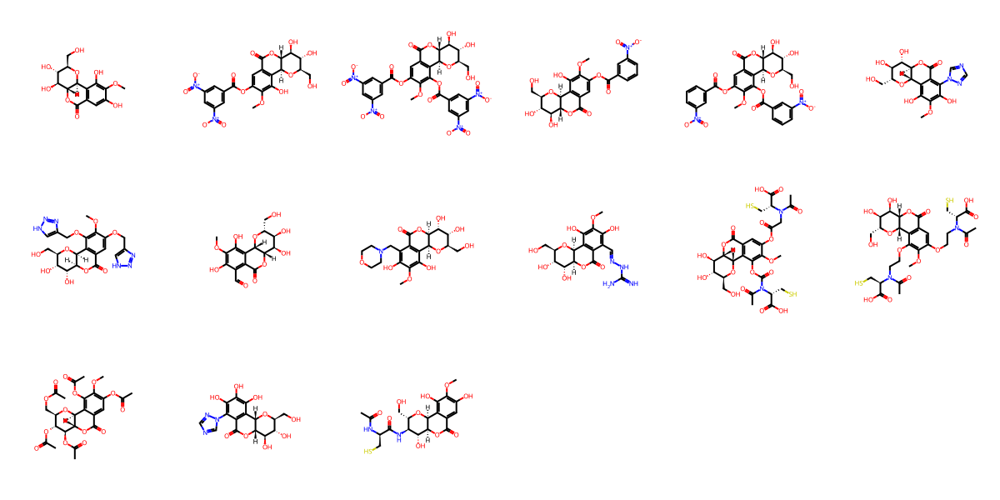

In [ ]:
#@title **Derivados da bergenina propostos e sintetizados por Dra. Ana Cristina**


from rdkit import Chem
from rdkit.Chem import rdBase
from rdkit.Chem import Draw
from rdkit.Chem.Draw import IPythonConsole
from rdkit import RDConfig
import os

%cd /content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/Estruturas químicas

mol2 = Chem.SDMolSupplier("derivates_bergenin_2d.sdf")
mols = [m for m in mol2 ]
img = Draw.MolsToGridImage(mols, molsPerRow=6, useSVG=True)
img

Instalando bibliotecas de visualização estrutural química...
Gerando a estrutura 2D...


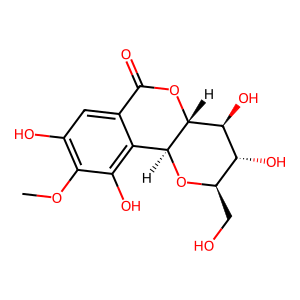

In [ ]:
#@title **Download da molécula 2D na base de dados PubChem e visualização de sua estrutura plana**
import os

print("Instalando bibliotecas de visualização estrutural química...")
os.system("pip3 install rdkit pubchempy")
print("Gerando a estrutura 2D...")
import pubchempy as pcp

molecule_name = "bergenin" #@param {type:"string"}

results = pcp.get_compounds(molecule_name, 'name')
for compound in results:
  smiles = compound.isomeric_smiles

from rdkit import Chem
from rdkit.Chem import Draw
m = Chem.MolFromSmiles(smiles)
Draw.MolToImage(m)

In [ ]:
#@title **Geração da estrutura tridimensional da molécula escolhida anteriormente**

import kora.install.rdkit
from rdkit import Chem
from rdkit.Chem import AllChem
import py3Dmol

molecule_name = "bergenin" #@param {type:"string"}
result_file_path = "/content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/Ligands" #@param {type:"string"}
%cd {result_file_path}

def convert(smi, style='stick'):
    mol = Chem.MolFromSmiles(smi)
    mol = Chem.AddHs(mol)
    AllChem.EmbedMolecule(mol)
    AllChem.MMFFOptimizeMolecule(mol, maxIters=30000)
    mblock = Chem.MolToMolBlock(mol)

    # Convert the Mol block to an RDKit molecule
    mol = Chem.MolFromMolBlock(mblock)

    # Save the molecule to a .mol2 file
    mol2_filename = f"""{molecule_name}_3d_rdkit_MMFF94.mol2"""
    Chem.MolToMolFile(mol, mol2_filename)
    print("A estrutura tridimensional da molécula escolhida foi salva com sucesso em .mol2")

    view = py3Dmol.view(width=400, height=400)
    view.addModel(mblock, 'mol')
    view.setStyle({style:{}})
    view.zoomTo()
    view.show()


# Conversão do código smiles para a estrutura tridimensional da molécula obtimizada com o campo de força MMFF94
convert(smiles)


/content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/Ligands
A estrutura tridimensional da molécula escolhida foi salva com sucesso em .mol2


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

In [ ]:
%cd /content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/Química Combinatória
!obabel Evolutionary_Library_bergenin.sdf -O Evolutionary_Library_bergenin.mol2 --gen3d best -p 7.4 --canonical

Caso seja uma molécula nova é preciso utilizar um software para desenho de estruturas químicas como o ACD ChemSketch (gratuito para fins acadêmicos),Perkin Elmer ChemDraw (pago) ou MarvinSketch (gratuito para fins acadêmicos). Depois, basta selecionar a respectiva estrutura e copiar como um código SMILES, que é uma representação computacional para visualização de moléculas.

MarvinJS: https://marvinjs-demo.chemaxon.com/latest/demo.html \\
*Obs.: É uma versão mais simples e portanto com menos recursos do que o MarvinSketch, mas que roda diretamente no navegador sem a necessidade da instalação do software.* \\

Perkin Elmer ChemDraw: https://drive.google.com/file/d/1VxrOm41_oONNMInfsWt1pMQ6G8_r7PI4/view?usp=sharing \\

MarvinSketch: https://download.chemaxon.com/marvin \\

ACD ChemSketch: https://www.acdlabs.com/resources/free-chemistry-software-apps/chemsketch-freeware/

##Pular esta etapa caso tenha encontrado com sucesso a molécula submetida anteriormente

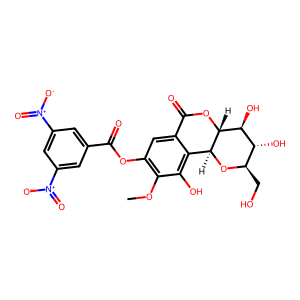

In [ ]:
#@title **Construção da molécula 2D a partir do código SMILES fornecido**

os.system("pip3 install rdkit scipy pandas")

codigo_SMILES = "COC1=C(OC(C2=CC([N+]([O-])=O)=CC([N+]([O-])=O)=C2)=O)C=C3C([C@H]4[C@H](OC3=O)[C@@H](O)[C@H](O)[C@@H](CO)O4)=C1O" #@param {type:"string"}

from rdkit import Chem
from rdkit.Chem import Draw
m = Chem.MolFromSmiles(codigo_SMILES)
Draw.MolToImage(m)

In [ ]:
#@title **Geração da estrutura tridimensional da molécula escolhida anteriormente**

import kora.install.rdkit
from rdkit import Chem
from rdkit.Chem import AllChem
import py3Dmol

def show(smi, style='stick'):
    mol = Chem.MolFromSmiles(smi)
    mol = Chem.AddHs(mol)
    AllChem.EmbedMolecule(mol)
    AllChem.MMFFOptimizeMolecule(mol, maxIters=20000)
    mblock = Chem.MolToMolBlock(mol)

    view = py3Dmol.view(width=400, height=400)
    view.addModel(mblock, 'mol')
    view.setStyle({style:{}})
    view.zoomTo()
    view.show()

# example
show(codigo_SMILES)  # or 'P'

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

In [ ]:
#@title **Conversão entre formatos químicos (.mol2, .pdbqt, .sdf, dentre outros...)**

ligand_path = '/content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/Docking molecular/AutoDock Vina (v.1.2.5)/Docking with Aldolase' #@param {type:"string"}
%cd {ligand_path}

!obabel -isdf Epalrestat.sdf -omol2 -O Epalrestat.mol2

/content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/Docking molecular/AutoDock Vina (v.1.2.5)/Docking with Aldolase
1 molecule converted


In [ ]:
#@title **Preparação e conversão do ligante para o formato .pdbqt necessário para o docking molecular usando o algoritmo AutoDock Tools 1.5.7**

ligand_path = '/content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/Estruturas químicas' #@param {type:"string"}
%cd {ligand_path}

ligand_name = "11-O-3-nitrobenzoyl-bergenin_MMFF94" #@param {type:"string"}

!prepare_ligand4.py -l {ligand_name}.mol2 -o {ligand_name}.pdbqt -U nphs_lps -v

/content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/Estruturas químicas
set verbose to  True
read  11-O-3-nitrobenzoyl-bergenin_MMFF94.mol2
setting up LPO with mode= automatic and outputfilename=  11-O-3-nitrobenzoyl-bergenin_MMFF94.pdbqt
and check_for_fragments= False
and bonds_to_inactivate= 
returning  0
No change in atomic coordinates


In [ ]:
#@title **Preparação e conversão de vários ligantes de uma única vez para o formato .pdbqt**

ligand_path = '/content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/Química Combinatória' #@param {type:"string"}
%cd {ligand_path}

#!prepare_ligand4.py -l *.mol2 -o *.pdbqt -U nphs_lps -v
!prepare_ligand4.py -l Evolutionary_Library_bergenin.mol2 -o Evolutionary_Library_bergenin.pdbqt -U nphs_lps -v


/content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/Química Combinatória
set verbose to  True
read  Evolutionary_Library_bergenin.mol2
setting up LPO with mode= automatic and outputfilename=  Evolutionary_Library_bergenin.pdbqt
and check_for_fragments= False
and bonds_to_inactivate= 
returning  0
No change in atomic coordinates


In [ ]:
!pip3 install rdkit scipy pandas numpy

### Utilização do pacote Meeko para preparação automatizada de ligantes

In [ ]:
#conda activate vina
#conda install python=3.9.7 # not strictly needed but prevents RDKit incompatibility
#conda install -c conda-forge numpy openbabel scipy rdkit
#pip install meeko

!pip3 install numpy scipy rdkit meeko pandas

  Using cached scipy-1.13.1-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (60 kB)
  Using cached rdkit-2023.9.6-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (3.9 kB)
  Using cached pandas-2.2.2-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (19 kB)
  Using cached pillow-10.3.0-cp310-cp310-manylinux_2_28_x86_64.whl.metadata (9.2 kB)
  Using cached pytz-2024.1-py2.py3-none-any.whl.metadata (22 kB)
  Using cached tzdata-2024.1-py2.py3-none-any.whl.metadata (1.4 kB)
Using cached scipy-1.13.1-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (38.6 MB)
Using cached rdkit-2023.9.6-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (34.9 MB)
Using cached pandas-2.2.2-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (13.0 MB)
Using cached pytz-2024.1-py2.py3-none-any.whl (505 kB)
Using cached tzdata-2024.1-py2.py3-none-any.whl (345 kB)
Using cached pillow-10.3.0-cp310-cp310-manylinux_2_28_x86_64.whl (4.

In [ ]:
%cd /content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/Estruturas químicas

!mk_prepare_ligand.py -i 11-O-3-nitrobenzoyl-bergenin_MMFF94.sdf -o 11-O-3-nitrobenzoyl-bergenin_MMFF94_meeko.pdbqt

# Construção de arquivo de configuração no docking molecular

In [ ]:
#@title **Geração do arquivo de configuração necessário para o docking molecular**

ligand_path = "/content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/Docking molecular/Ligands" #@param {type:"string"}
ligand_name = "Epalrestat.pdbqt" #@param {type:"string"}
receptor_path = "/content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/Docking molecular/Receptors" #@param {type:"string"}
receptor_name = "7pp1_prep_maestro.pdbqt" #@param {type:"string"}

grid_box_center_x = "-22.418  " #@param {type:"string"}
grid_box_center_y = "26.560" #@param {type:"string"}
grid_box_center_z = "27.154" #@param {type:"string"}

grid_box_size_x = "21.322 "  #@param {type:"string"}
grid_box_size_y = "36.868" #@param {type:"string"}
grid_box_size_z = "33.776" #@param {type:"string"}

print("Grid box center x:", grid_box_center_x)

exhaustiveness = "96" #@param {type:"string"}
docking_results_path = '/content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/Docking molecular/AutoDock Vina (v.1.2.5)/Docking with P2Y12 (PDB ID 7PP1)' #@param {type:"string"}
%cd {docking_results_path}
docking_results_name = 'result_docking1_7pp1_P2Y12_Epalrestat' #@param {type:"string"}
config_file_name = 'config_rigid_7pp1_P2Y12_docking.txt' #@param {type:"string"}

# Define the text content
text_content = f"""receptor = {receptor_path}/{receptor_name}
ligand = {ligand_path}/{ligand_name}
center_x = {grid_box_center_x}
center_y = {grid_box_center_y}
center_z = {grid_box_center_z}
size_x = {grid_box_size_x}
size_y = {grid_box_size_y}
size_z = {grid_box_size_z}
out = {docking_results_name}.pdbqt
exhaustiveness = {exhaustiveness}
"""

# Specify the file name
file_name = f"{config_file_name}"

# Open the file in write mode and write the content
with open(file_name, "w") as file:
    file.write(text_content)

print(f"O arquivo '{file_name}' foi criado e salvo com sucesso.")


Grid box center x: -22.418  
/content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/Docking molecular/AutoDock Vina (v.1.2.5)/Docking with P2Y12 (PDB ID 7PP1)
O arquivo 'config_rigid_7pp1_P2Y12_docking.txt' foi criado e salvo com sucesso.


# Realização das simulações de docking molecular com o AutoDock Vina v.1.2.5

Para cada complexo proteína-ligante é executado o script de docking abaixo. Se for considerado a flexibilidade parcial do receptor, basta colocar o nome do arquivo .pdbqt flexível ao lado do nome para a estrutura rígida. Mesmo o algoritmo limitando para

In [ ]:
#@title **Download do algoritmo AutoDock Vina v.1.2.5**


#Download and extract Autodock Vina from SCRIPPS
#Then, we set up an alias for vina to be treated as a native binary
docking_calculations_path = '/content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/Docking calculations/AutoDock Vina (v.1.2.5)' #@param {type:"string"}
%cd {docking_calculations_path}

print("Baixando executável do AutoDock Vina v.1.2.5...")
!wget -q https://github.com/ccsb-scripps/AutoDock-Vina/releases/download/v1.2.5/vina_1.2.5_linux_x86_64
!chmod +x vina_1.2.5_linux_x86_64
print("Instalação do AutoDock Vina v.1.2.5 feita com sucesso.")

/content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/Docking calculations/AutoDock Vina (v.1.2.5)
Baixando executável do AutoDock Vina v.1.2.5...
Instalação do AutoDock Vina v.1.2.5 feita com sucesso.


In [ ]:
#@title **Execução do docking molecular a partir do ligante e receptor descritos nas etapas anteriores**

config_file_name = 'config_4ntj_bergenin.txt' #@param {type:"string"}

print("Realizando o docking molecular...")
!./vina_1.2.5_linux_x86_64 --config {config_file_name}

Realizando o docking molecular...
AutoDock Vina v1.2.5
#################################################################
# If you used AutoDock Vina in your work, please cite:          #
#                                                               #
# J. Eberhardt, D. Santos-Martins, A. F. Tillack, and S. Forli  #
# AutoDock Vina 1.2.0: New Docking Methods, Expanded Force      #
# Field, and Python Bindings, J. Chem. Inf. Model. (2021)       #
# DOI 10.1021/acs.jcim.1c00203                                  #
#                                                               #
# O. Trott, A. J. Olson,                                        #
# AutoDock Vina: improving the speed and accuracy of docking    #
# with a new scoring function, efficient optimization and       #
# multithreading, J. Comp. Chem. (2010)                         #
# DOI 10.1002/jcc.21334                                         #
#                                                               #
# Please see https://

In [ ]:
#@title **Execução do docking molecular para o receptor P38 MAPK**

%cd /content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/Docking calculations/AutoDock Vina (v.1.2.5)
config_file_name = 'config_1ouk_P38_MAPK_docking.txt' #@param {type:"string"}

print("Realizando o docking molecular...")
!./vina_1.2.5_linux_x86_64 --config {config_file_name}

/content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/Docking calculations/AutoDock Vina (v.1.2.5)
Realizando o docking molecular...
AutoDock Vina v1.2.5
#################################################################
# If you used AutoDock Vina in your work, please cite:          #
#                                                               #
# J. Eberhardt, D. Santos-Martins, A. F. Tillack, and S. Forli  #
# AutoDock Vina 1.2.0: New Docking Methods, Expanded Force      #
# Field, and Python Bindings, J. Chem. Inf. Model. (2021)       #
# DOI 10.1021/acs.jcim.1c00203                                  #
#                                                               #
# O. Trott, A. J. Olson,                                        #
# AutoDock Vina: improving the speed and accuracy of docking    #
# with a new scoring function, efficient optimization and       #
# multithreading, J. Comp. Chem. (2010)                         #
# DOI 10.1002/jcc.213

# Analisando os resultados obtidos pelo docking molecular

É importante que os resultados sejam convertidos primeiramente para .mol2, para evitar que haja distorções na estrutura do ligante.

In [ ]:
#@title **Conversão do resultado de .pdbqt para .mol2**

#We need to convert our Autodock Vina results from pdbqt into pdb
#For this, we use babel
docking_results_path = '/content/drive/MyDrive/Iniciação Científica/Pibic 2024-2025/Nanoformulação/Docking com beta-CD' #@param {type:"string"}
%cd {docking_results_path}

result_file = "docking1_hp_beta_cd_bergenin_dft_6_311g" #@param {type:"string"}

!obabel -ipdbqt {result_file}.pdbqt -omol2 -O {result_file}.mol2 -p --unique --title {result_file}


/content/drive/MyDrive/Iniciação Científica/Pibic 2024-2025/Nanoformulação/Docking com beta-CD
*** Open Babel Warning  in InChI code
  docking1_hp_beta_cd_bergenin_dft_6_311g.pdbqt :Accepted unusual valence(s): C(3); C(2); C(1)
*** Open Babel Warning  in InChI code
  docking1_hp_beta_cd_bergenin_dft_6_311g.pdbqt :Accepted unusual valence(s): C(3); C(2); C(1)
Removed docking1_hp_beta_cd_bergenin_dft_6_311g.pdbqt - a duplicate of docking1_hp_beta_cd_bergenin_dft_6_311g.pdbqt (#1)
*** Open Babel Warning  in InChI code
  docking1_hp_beta_cd_bergenin_dft_6_311g.pdbqt :Accepted unusual valence(s): C(3); C(2); C(1)
Removed docking1_hp_beta_cd_bergenin_dft_6_311g.pdbqt - a duplicate of docking1_hp_beta_cd_bergenin_dft_6_311g.pdbqt (#2)
*** Open Babel Warning  in InChI code
  docking1_hp_beta_cd_bergenin_dft_6_311g.pdbqt :Accepted unusual valence(s): C(3); C(2); C(1)
Removed docking1_hp_beta_cd_bergenin_dft_6_311g.pdbqt - a duplicate of docking1_hp_beta_cd_bergenin_dft_6_311g.pdbqt (#3)
**

In [ ]:
#@title **Conversão do resultado de .mol2 para .pdb**

#We need to convert our Autodock Vina results from pdbqt into pdb
#For this, we use babel
docking_results_path = '/content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/Docking molecular/AutoDock Vina (v.1.2.5)/Docking with Aldolase/Docking results' #@param {type:"string"}
%cd {docking_results_path}

result_file = "result_redocking1_4jir_Aldolase_only_ligand_Epalrestat" #@param {type:"string"}

!obabel -imol2 {result_file}.mol2 -opdb -O {result_file}.pdb -p --unique --title {result_file}


/content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/Docking molecular/AutoDock Vina (v.1.2.5)/Docking with Aldolase/Docking results
*** Open Babel Warning  in InChI code
  result_redocking1_4jir_Aldolase_only_ligand_Epalrestat :Ambiguous stereo: center(s)
1 molecule converted


In [ ]:
#@title **União do complexo proteína-ligante final a partir do resultado de docking**

!pip3 install parmed
import parmed as pmd

ligand_file = "result_docking1_4jir_Aldolase_derivate_acd72"        #@param {type:"string"}
receptor_pdb_file = "4jir_aldolase_prepared_maestro.pdb"    #@param {type:"string"}
output_pdb_file = "complex_result_docking1_4jir_Aldolase_derivate_acd72.pdb"  #@param {type:"string"}

#!obabel -imol2 {result_file}.mol2 -opdb -O {result_file}.pdb -p --unique --title {result_file}

print("Unindo o complexo proteína-ligante...")
pdb1 = pmd.load_file(f"{ligand_file}.pdb")
pdb2 = pmd.load_file(f"{receptor_pdb_file}")

combined = pdb1 + pdb2
combined.save(f"{output_pdb_file}")
print("O complexo foi salvo com sucesso!")

Unindo o complexo proteína-ligante...
O complexo foi salvo com sucesso!


In [ ]:
#@title **Visualização do ligante ancorado no sítio da proteína**

docking_results_path = "/content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/Docking molecular/AutoDock Vina (v.1.2.5)/Docking with Aldolase" #@param {type:"string"}
%cd {docking_results_path}

ligand_pdb_file = "result_docking1_4jir_Aldolase_bergenin_dft_6_311G.pdb"        #@param {type:"string"}
receptor_pdb_file = "4jir_aldolase_prepared_maestro.pdb"    #@param {type:"string"}

!pip3 install py3Dmol
import py3Dmol
v = py3Dmol.view()
v.addModel(open(f'{receptor_pdb_file}').read())
v.setStyle({'model':0},{'cartoon':{}})
v.addModel(open(f'{ligand_pdb_file}').read())
v.setStyle({'model':1},{'stick':{'colorscheme':'greenCarbon','radius':.125}})
v.addModelsAsFrames(open(f'{receptor_pdb_file}').read())
v.animate({'interval':1000})
v.zoomTo({'model':1})
v.rotate(90)

/content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/Docking molecular/AutoDock Vina (v.1.2.5)/Docking with Aldolase


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

Interação entre o receptor Aldolase Reductase e a conformação obtida no docking molecular com a bergenina

# Triagem virtual automatizada usando AutoDock Vina v.1.2.5

In [ ]:
# vina_screen_local.sh
#! /bin/bash

for f in ligand_*.pdbqt; do
    b=`basename $f .pdbqt`
    echo Processing ligand $b
    mkdir -p $b
    vina --config conf.txt --ligand $f --out ${b}/out.pdbqt --log ${b}/log.txt
done

In [ ]:
vina --config config.txt --batch ligands_dir/*.pdbqt


In [ ]:
# @title **Run AutoDock Vina**
# @markdown Select **< Exhaustiveness >** for molecular docking. **[ Default is 16 ]** \
# @markdown This generates a **`output.pdbqt`** containing different binding
# @markdown poses predicted for each docked ligand.

Exhaustiveness = '32' # @param [4, 8, 16, 32, 64, 128, 256]

cpu_cores = os.cpu_count()
LIG_dFLDs = sorted(folder[:-1] for folder in glob.glob(DCK_FLD + '/*/'))

# -- Start screening --
start = time.time()
count = 0
for folder in tqdm(LIG_dFLDs):
    LIG_ID = os.path.basename(folder)
    LIG_pdbqt = LIG_ID + '.pdbqt'
    LIG_oupt_log = LIG_ID + '_output.log'
    LIG_oupt_pdbqt = LIG_ID + '_output.pdbqt'
    LIG_dFLD = os.path.join(DCK_FLD, LIG_ID)
    LIG_pdbqt_dFFile = os.path.join(LIG_dFLD, LIG_pdbqt)
    LIG_oupt_log_dFFile = os.path.join(LIG_dFLD, LIG_oupt_log)
    LIG_oupt_pdbqt_dFFile = os.path.join(LIG_dFLD, LIG_oupt_pdbqt)

    %vina --receptor {PROT_pdbqt_dFile} --ligand {LIG_pdbqt_dFFile} \
    --out {LIG_oupt_pdbqt_dFFile} --config {cfg_dFile} --cpu {cpu_cores} \
    --exhaustiveness {Exhaustiveness} --verbosity 2 &> {LIG_oupt_log_dFFile}

    count += 1
end = time.time()
# -- End screening --

print(f'')
print(f'+ Screening completed')
print(f'+ Time elapsed: ' + time.strftime('%Mm %Ss', time.gmtime(end - start)))
print(f'+ {count} ligand_output.pdbqt > DOCKING folder')

# Análise gráfica dos resultados de docking molecular

/content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/Docking molecular/Docking analysis


<ipython-input-23-b0667129573b>:13: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn')


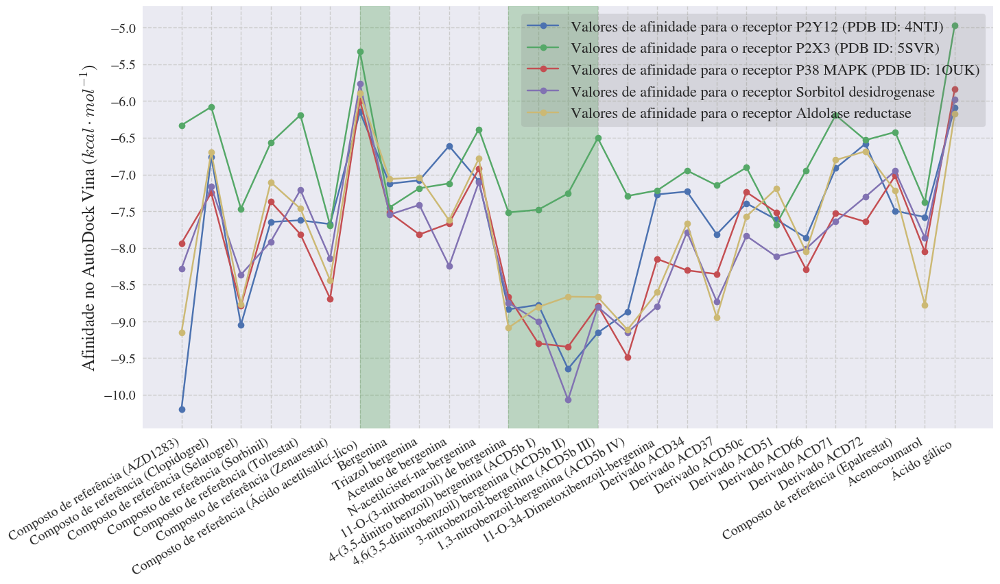

In [ ]:
#@title **Gráfico da afinidade obtida para os diferentes ligantes analisados**

import matplotlib.pyplot as plt
import pandas as pd

%cd /content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/Docking molecular/Docking analysis
d1 = pd.read_csv('Docking_valores_afinidade_16_07_2024.csv', decimal='.')

import matplotlib.pyplot as plt
import numpy as np

%matplotlib inline
plt.style.use('seaborn')

plt.rcParams['mathtext.fontset'] = 'cm'
plt.rcParams['font.family'] = 'STIXGeneral'

fig = plt.figure(figsize=(16,8))
ax = plt.subplot(111)
#ax.set_xticks(np.arange(150, 420, 20))
ax.set_yticks(np.arange(-5, -12, -0.50))
#plt.xlim([150, 420])
#plt.ylim([-10.5, -4])
ax.grid(which='major', color='#CCCCCC', linestyle='--')
ax.grid(which='minor', color='#CCCCCC', linestyle='--')
#ax.tick_params(axis='both', which='minor', labelsize=8)

plt.plot(d1['Substancia'], d1['P2Y12'], marker ='o', label='Valores de afinidade para o receptor P2Y12 (PDB ID: 4NTJ)')
plt.plot(d1['Substancia'], d1['P2X3'], marker ='o', label='Valores de afinidade para o receptor P2X3 (PDB ID: 5SVR)')
plt.plot(d1['Substancia'], d1['P38_MAPK'], marker ='o', label='Valores de afinidade para o receptor P38 MAPK (PDB ID: 1OUK)')
plt.plot(d1['Substancia'], d1['Sorbitol_desidrogenase'], marker ='o', label='Valores de afinidade para o receptor Sorbitol desidrogenase')
plt.plot(d1['Substancia'], d1['Aldolase_reductase'], marker ='o', label='Valores de afinidade para o receptor Aldolase reductase')
plt.setp(ax.get_xticklabels(), rotation=30, horizontalalignment='right')
plt.axvspan(11, 14, color='green', alpha=0.2)
plt.axvspan(6, 7, color='green', alpha=0.2)
#ax.axvspan(d1(['4,6(3,5-dinitrobenzoil) bergenina (ACD5b II)']), color='red', alpha=0.5)

plt.ylabel('Afinidade no AutoDock Vina ($kcal \cdot mol^{-1}$)', fontsize=18)

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend(facecolor="gray", framealpha=0.2, frameon=True, fontsize=16, loc=1)
plt.savefig('plot_analise_docking_vina_completo.png', dpi=300, bbox_inches = 'tight')

/content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/Docking molecular/Docking analysis


<ipython-input-4-5e3cd9e84f40>:13: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn')
<ipython-input-4-5e3cd9e84f40>:43: UserWarning: Glyph 8203 (\N{ZERO WIDTH SPACE}) missing from current font.
  plt.savefig('plot_analise_docking_vina_english.png', dpi=300, bbox_inches = 'tight')
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 8203 (\N{ZERO WIDTH SPACE}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


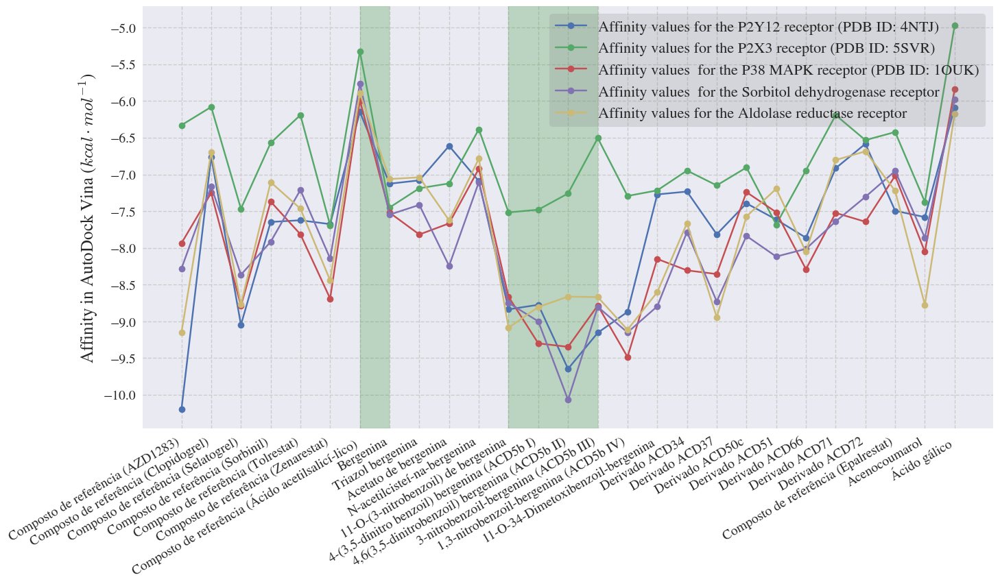

In [ ]:
#@title **Gráfico da afinidade obtida para os diferentes ligantes analisados**

import matplotlib.pyplot as plt
import pandas as pd

%cd /content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/Docking molecular/Docking analysis
d1 = pd.read_csv('Docking_valores_afinidade_16_07_2024.csv', decimal='.')

import matplotlib.pyplot as plt
import numpy as np

%matplotlib inline
plt.style.use('seaborn')

plt.rcParams['mathtext.fontset'] = 'cm'
plt.rcParams['font.family'] = 'STIXGeneral'

fig = plt.figure(figsize=(16,8))
ax = plt.subplot(111)
#ax.set_xticks(np.arange(150, 420, 20))
ax.set_yticks(np.arange(-5, -12, -0.50))
#plt.xlim([150, 420])
#plt.ylim([-10.5, -4])
ax.grid(which='major', color='#CCCCCC', linestyle='--')
ax.grid(which='minor', color='#CCCCCC', linestyle='--')
#ax.tick_params(axis='both', which='minor', labelsize=8)

plt.plot(d1['Substancia'], d1['P2Y12'], marker ='o', label='Affinity values for the P2Y12 receptor (PDB ID: 4NTJ)')
plt.plot(d1['Substancia'], d1['P2X3'], marker ='o', label='Affinity values for the P2X3 receptor (PDB ID: 5SVR)')
plt.plot(d1['Substancia'], d1['P38_MAPK'], marker ='o', label='Affinity values ​for the P38 MAPK receptor (PDB ID: 1OUK)')
plt.plot(d1['Substancia'], d1['Sorbitol_desidrogenase'], marker ='o', label='Affinity values ​for the Sorbitol dehydrogenase receptor')
plt.plot(d1['Substancia'], d1['Aldolase_reductase'], marker ='o', label='Affinity values for the Aldolase reductase receptor')
plt.setp(ax.get_xticklabels(), rotation=30, horizontalalignment='right')
plt.axvspan(11, 14, color='green', alpha=0.2)
plt.axvspan(6, 7, color='green', alpha=0.2)
#ax.axvspan(d1(['4,6(3,5-dinitrobenzoil) bergenina (ACD5b II)']), color='red', alpha=0.5)

plt.ylabel('Affinity in AutoDock Vina ($kcal \cdot mol^{-1}$)', fontsize=18)

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend(facecolor="gray", framealpha=0.2, frameon=True, fontsize=16, loc=1)
plt.savefig('plot_analise_docking_vina_english.png', dpi=300, bbox_inches = 'tight')

In [ ]:
#@title **Visualização em tabelas dos dados de afinidade para os diferentes derivados da bergeninas analisados**

%cd /content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/Docking molecular/Docking analysis

import pandas as pd

dados = pd.read_csv("Docking_valores_afinidade_16_07_2024.csv")
dados

/content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/Docking molecular/Docking analysis


,Substancia,P2Y12,P2X3,P38_MAPK,Sorbitol_desidrogenase,Aldolase_reductase
0,Composto de referência (AZD1283),-10.200,-6.328,-7.937,-8.282,-9.154
1,Composto de referência (Clopidogrel),-6.758,-6.080,-7.251,-7.163,-6.696
2,Composto de referência (Selatogrel),-9.049,-7.467,-8.789,-8.366,-8.770
3,Composto de referência (Sorbinil),-7.647,-6.570,-7.370,-7.917,-7.105
4,Composto de referência (Tolrestat),-7.624,-6.190,-7.815,-7.211,-7.466
5,Composto de referência (Zenarestat),-7.677,-7.693,-8.691,-8.146,-8.443
6,Composto de referência (Ácido acetilsalicí­lico),-6.149,-5.322,-5.991,-5.762,-5.893
7,Bergenina,-7.126,-7.450,-7.521,-7.547,-7.062
8,Triazol bergenina,-7.080,-7.188,-7.818,-7.415,-7.039
9,Acetato de bergenina,-6.611,-7.122,-7.667,-8.246,-7.625


# Outras ferramentas importantes na bioinformática

In [ ]:
#@title **Unir vários arquivos de um mesmo formato químico num único apenas**
%cd /content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/Estruturas químicas/mol2
!cat *.sdf > bergenin_derivates_docking.sdf

/content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/Estruturas químicas/mol2


In [ ]:
#@title **Conversão entre formatos químicos (.mol2, .pdbqt, .sdf, dentre outros...)**

%cd /content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/Estruturas químicas
!obabel -ismi all_derivates_bergenin.smiles -osdf -O all_derivates_bergenin.sdf

/content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/Estruturas químicas
*** Open Babel Warning  in WriteMolecule
  No 2D or 3D coordinates exist. Stereochemical information will be stored using an Open Babel extension. To generate 2D or 3D coordinates instead use --gen2D or --gen3D.
15 molecules converted


In [ ]:
#@title **Geração de confôrmero 3D e conversão para .mol2**
%cd /content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/Química Combinatória
!obabel -imol2 maestro_enumeration_nitrobenzene_derivates_bergenin.mol2 -osdf -O maestro_enumeration_nitrobenzene_derivates_bergenin_3d.sdf --gen3D

/content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/Química Combinatória
*** Open Babel Error  in Do
  3D coordinate generation failed
*** Open Babel Error  in Do
  3D coordinate generation failed
*** Open Babel Error  in Do
  3D coordinate generation failed
*** Open Babel Error  in Do
  3D coordinate generation failed
*** Open Babel Error  in Do
  3D coordinate generation failed
*** Open Babel Error  in Do
  3D coordinate generation failed
*** Open Babel Error  in Do
  3D coordinate generation failed
*** Open Babel Error  in Do
  3D coordinate generation failed
*** Open Babel Error  in Do
  3D coordinate generation failed
100 molecules converted


#Simulações de dinâmica molecular

Na preparação da topologia do ligante pelo CGenFF é fundamental que todos os átomos de Hidrogênios tenham sido adicionados explicitamente. Isso por ser feito com do Chimera, por exmeplo.

Outro detalhe muito importante, é construir o complexo proteína-ligante novamente pelo Maestro, mas agora usando o ligante em .mol2 retornado pelo CGenFF. Apenas desta forma, o QwikMD não irá acusar que existem diferenças na indicação de cada átomo ou conectividade entre os .mol2.

In [ ]:
!wget https://www.ks.uiuc.edu/Research/namd/3.0b3/download/897501/NAMD_3.0b3_Linux-x86_64-multicore-CUDA.tar.gz -p /content/drive/MyDrive/Molecular dynamics

--2023-09-26 18:00:25--  https://www.ks.uiuc.edu/Research/namd/3.0b3/download/897501/NAMD_3.0b3_Linux-x86_64-multicore-CUDA.tar.gz
Resolving www.ks.uiuc.edu (www.ks.uiuc.edu)... 130.126.120.43
Connecting to www.ks.uiuc.edu (www.ks.uiuc.edu)|130.126.120.43|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 242465080 (231M) [application/x-gzip]
Saving to: ‘www.ks.uiuc.edu/Research/namd/3.0b3/download/897501/NAMD_3.0b3_Linux-x86_64-multicore-CUDA.tar.gz’

www.ks.uiuc.edu/Res 100%[===================>] 231.23M  91.0MB/s    in 2.5s    

2023-09-26 18:00:31 (91.0 MB/s) - ‘www.ks.uiuc.edu/Research/namd/3.0b3/download/897501/NAMD_3.0b3_Linux-x86_64-multicore-CUDA.tar.gz’ saved [242465080/242465080]

/content/drive/MyDrive/Molecular: Scheme missing.
--2023-09-26 18:00:31--  http://dynamics/
Resolving dynamics (dynamics)... failed: Name or service not known.
wget: unable to resolve host address ‘dynamics’
FINISHED --2023-09-26 18:00:31--
Total wall clock time: 5.6s
Downloa

In [ ]:
#

### Nanoencapsulamento da Bergenina por beta-ciclodextrina

Instalando bibliotecas de visualização estrutural química...
Gerando a estrutura 2D...


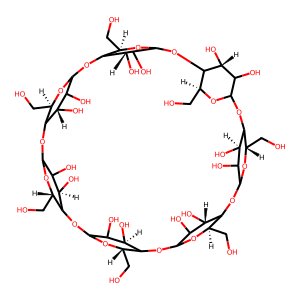

In [ ]:
#@title **Download da estrutura 2D da beta-ciclodextrina ($\beta$-CD)**
import os

print("Instalando bibliotecas de visualização estrutural química...")
os.system("pip3 install rdkit pubchempy")
print("Gerando a estrutura 2D...")
import pubchempy as pcp

molecule_name = "beta-cyclodextrin" #@param {type:"string"}

results = pcp.get_compounds(molecule_name, 'name')
for compound in results:
  smiles_pubchem = compound.isomeric_smiles

from rdkit import Chem
from rdkit.Chem import Draw
m = Chem.MolFromSmiles(smiles_pubchem)
Draw.MolToImage(m)

### Construção dos gráficos de estabilidade RMSD, RMSF, raio de giro...


/content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/Dinâmica molecular


<ipython-input-26-e4127d1a98b2>:16: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn')


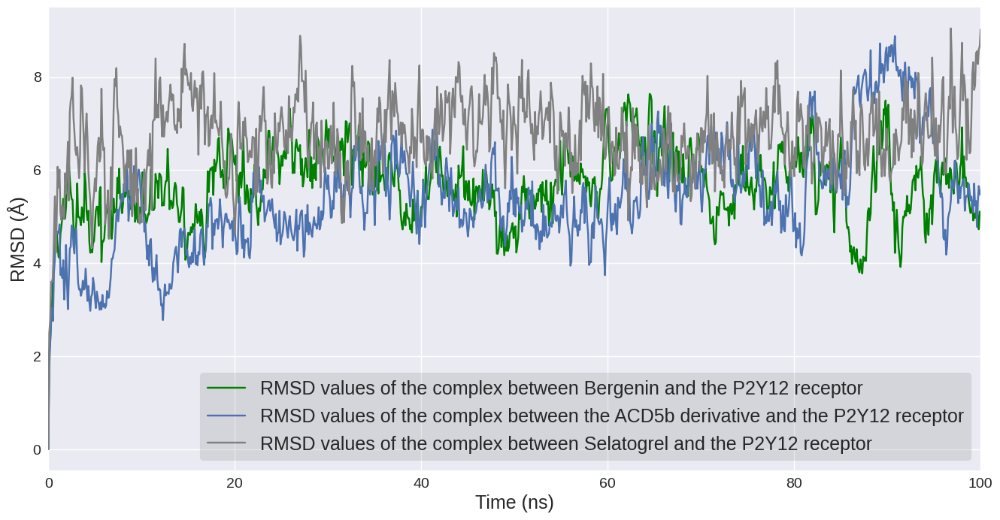

In [ ]:
#@title **Análise da estabilidade na dinâmica molecular de Bergenina e Selatogrel**
import matplotlib.pyplot as plt
import pandas as pd

%cd /content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/Dinâmica molecular/

d1 = pd.read_csv('/content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/Dinâmica molecular/rmsd_all_P2Y12_bergenin_md_200ns.csv', decimal='.')
d2 = pd.read_csv('/content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/Dinâmica molecular/md_100ns_7pp1_selatogrel_rmsd_all.csv', decimal='.')
d3 = pd.read_csv('/content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/Dinâmica molecular/md_rmsd_all_P2Y12_7ppi_ACD5b_I_100ns.csv', decimal='.')


import matplotlib.pyplot as plt
import numpy as np

%matplotlib inline
plt.style.use('seaborn')

fig = plt.figure(figsize=(16,8))
ax = plt.subplot(111)
#ax.set_xticks(np.arange(150, 420, 20))
#ax.set_yticks(np.arange(0, 1, 0.10))
#ax.grid(which='major', color='#CCCCCC', linestyle='--')
#ax.grid(which='minor', color='#CCCCCC', linestyle='--')
plt.xlim([0, 100])
#plt.ylim([0, 1])
plt.plot(d1['Time (ns)'], d1['RMSD'], label='RMSD values of the complex between Bergenin and the P2Y12 receptor', color='green')
plt.plot(d3['Time (ns)'], d3['RMSD'], label='RMSD values of the complex between the ACD5b derivative and the P2Y12 receptor')
plt.plot(d2['Time (ns)'], d2['RMSD'], label='RMSD values of the complex between Selatogrel and the P2Y12 receptor', color='gray')

# A conversão de epsilon para absorbância requer o uso da Lei de Beer-Lambert, onde A = epsilon (M^{-1} . cm^-1) * l (cm) * c (mol/L)

plt.xlabel('Time (ns)', fontsize=18)
plt.ylabel('RMSD (Å)', fontsize=18)

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend(facecolor="gray", framealpha=0.2, frameon=True, fontsize=18, loc=4)
plt.savefig('article_english_md_rmsd_bergenin_acd5B_selatogrel_P2Y12.png', dpi=300, bbox_inches = 'tight')

In [ ]:
print(d1['RMSD'].max())
print(d2['RMSD'].max())
print(d3['RMSD'].max())

7.777689267768832
9.04821190555373
8.881764314042965


#Química combinatória e proposta de novos derivados da bergenina

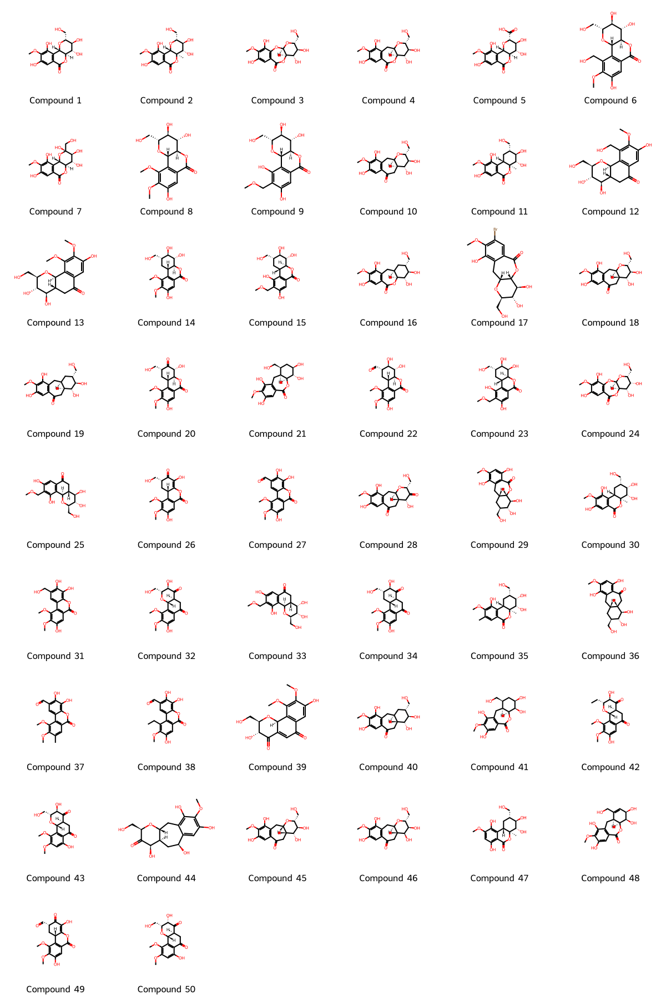

In [ ]:
from rdkit import Chem
from rdkit.Chem import rdBase
from rdkit.Chem import Draw
from rdkit.Chem.Draw import IPythonConsole
from rdkit import RDConfig
import os
sdf = Chem.SDMolSupplier("Evolutionary_Library_bergenin.sdf")
mols = [  m for m in sdf ]
img = Draw.MolsToGridImage( mols, molsPerRow=6, useSVG=True, legends=[x.GetProp("_Name") for x in mols[0:]])
img

In [ ]:
!pip3 install rdkit

  Using cached rdkit-2024.3.3-cp310-cp310-manylinux_2_28_x86_64.whl.metadata (3.9 kB)
  Using cached pillow-10.4.0-cp310-cp310-manylinux_2_28_x86_64.whl.metadata (9.2 kB)
Using cached rdkit-2024.3.3-cp310-cp310-manylinux_2_28_x86_64.whl (33.1 MB)
Using cached pillow-10.4.0-cp310-cp310-manylinux_2_28_x86_64.whl (4.5 MB)


/content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/Química Combinatória


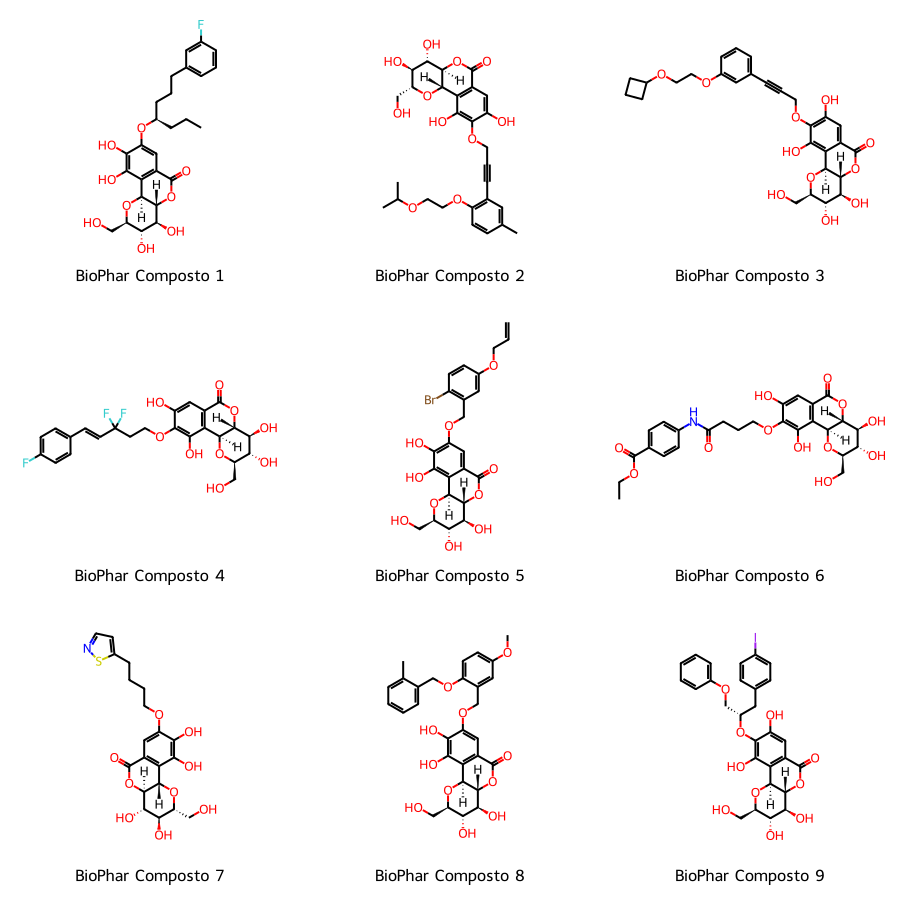

In [ ]:
from rdkit import Chem
from rdkit.Chem import rdBase
from rdkit.Chem import Draw
from rdkit.Chem.Draw import IPythonConsole
from rdkit import RDConfig
import os

%cd /content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/Química Combinatória

sdf = Chem.SDMolSupplier("best_screening_P2Y12_dockthor_maestro_nitrobenzene_enumeration.sdf")
mols = [  m for m in sdf ]
img = Draw.MolsToGridImage( mols, molsPerRow=3, useSVG=False, returnPNG=True, subImgSize=(400, 400), legends=[x.GetProp("_Name") for x in mols[0:]])
img


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


/content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/Química Combinatória


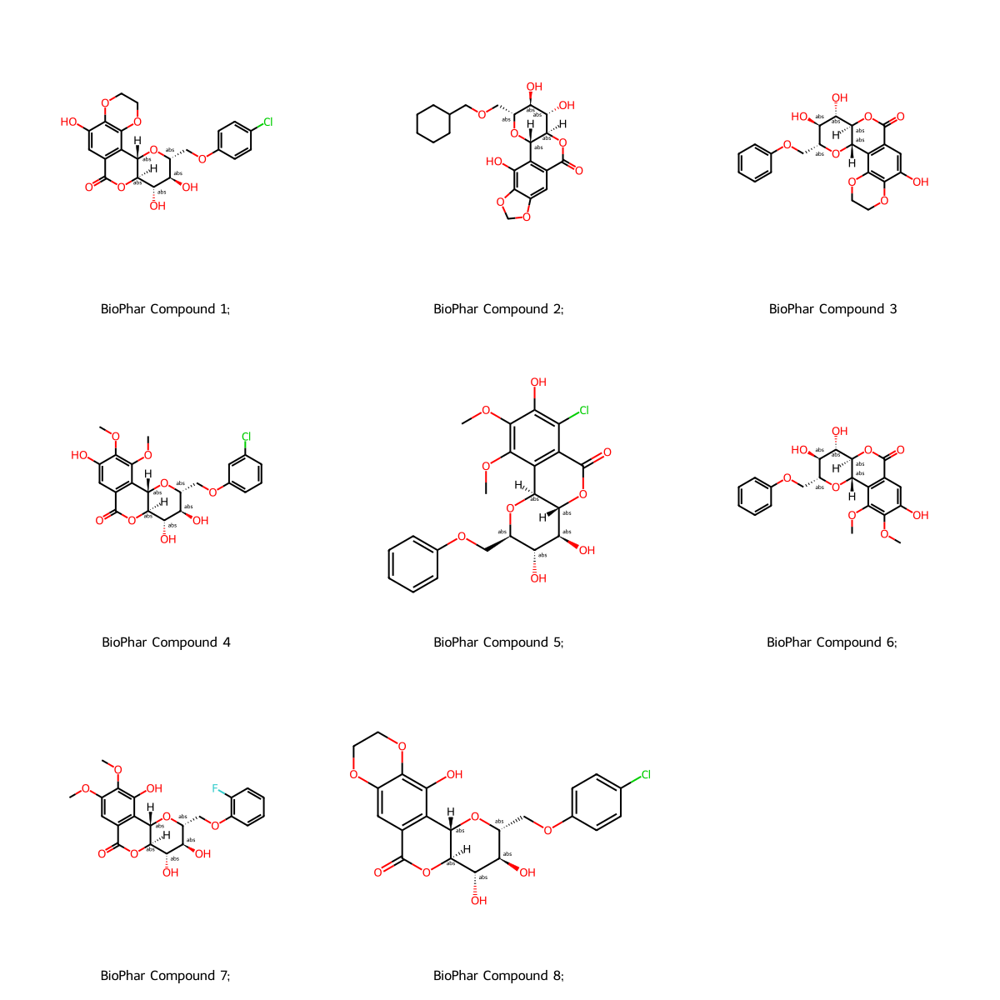

In [ ]:
from rdkit import Chem
from rdkit.Chem import rdBase
from rdkit.Chem import Draw
from rdkit.Chem.Draw import IPythonConsole
from rdkit import RDConfig
import os

%cd /content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/Química Combinatória

sdf = Chem.SDMolSupplier("screening_2d_conf_P2Y12_bergenin_derivates_AIDD_02_08_24.sdf")
mols = [  m for m in sdf ]
img = Draw.MolsToGridImage( mols, molsPerRow=3, useSVG=False, returnPNG=True, subImgSize=(400, 400), legends=[x.GetProp("_Name") for x in mols[0:]])
img


In [ ]:
from rdkit import Chem
from rdkit.Chem import rdMolDescriptors
from rdkit.Chem import Draw

# Load the molecules from the SDF file
sdf = Chem.SDMolSupplier("screening_2d_conf_P2Y12_bergenin_derivates_AIDD_02_08_24.sdf")
mols = [m for m in sdf if m is not None]

# Calculate molecular masses
molecular_masses = [rdMolDescriptors.CalcExactMolWt(m) for m in mols]

# Display molecular masses along with the images
legends = [f"{m.GetProp('_Name')}: {mass:.2f} g/mol" for m, mass in zip(mols, molecular_masses)]
img = Draw.MolsToGridImage(mols, molsPerRow=3, useSVG=False, returnPNG=True, subImgSize=(400, 400), legends=legends)
img


ModuleNotFoundError: No module named 'rdkit'

#Curva de ionização e valores de pK_a da bergenina

/content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/ADME


KeyError: 'pH '

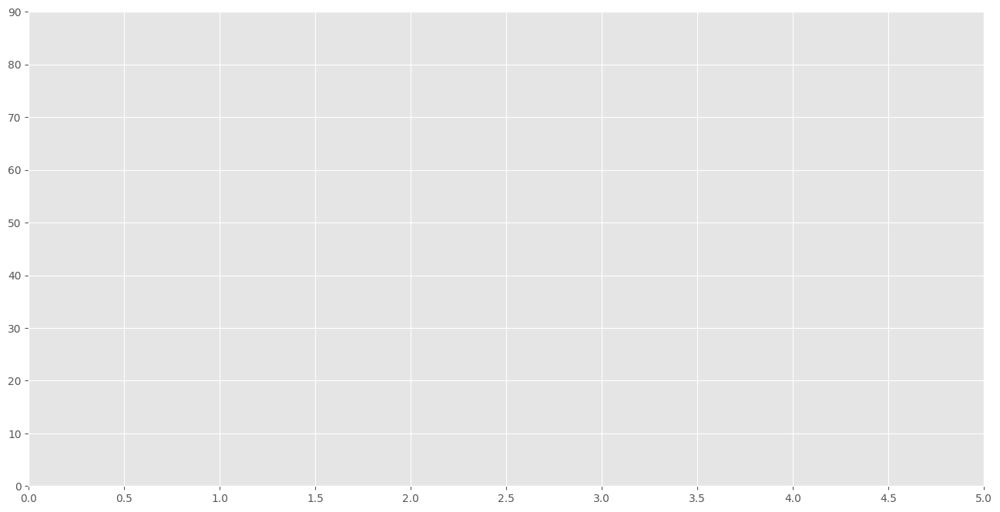

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

%cd /content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/ADME

d1 = pd.read_csv('curva_ionizacao_bergenin4.csv', decimal='.')

import matplotlib.pyplot as plt
import numpy as np

%matplotlib inline
plt.style.use('ggplot')

fig = plt.figure(figsize=(16,8))
ax = plt.subplot(111)
ax.set_xticks(np.arange(0, 5.1, 0.5))
ax.set_yticks(np.arange(0, 100, 10))
#ax.grid(which='major', color='#CCCCCC', linestyle='--')
#ax.grid(which='minor', color='#CCCCCC', linestyle='--')
plt.plot(d1['pH '], d1['Ionization_1'], label='Curva de ionização 1', color='blue')
plt.plot(d1['pH'], d1['Ionization_2'], label='Curva de ionização 2', color='green')
#plt.plot(d2['X'], d2['Y']/(d2['Y'].max()), label='Espectro UV-Vis téorico da molecula ACD5b')
# A conversão de epsilon para absorbância requer o uso da Lei de Beer-Lambert, onde A = epsilon (M^{-1} . cm^-1) * l (cm) * c (mol/L)

plt.xlabel('pH', fontsize=18)
plt.ylabel('Percentual de espécies químicas (%)', fontsize=18)

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend(facecolor="gray", framealpha=0.2, frameon=True, fontsize=18)
plt.savefig('curva_ionizacao_bergenina.png', dpi=300, bbox_inches = 'tight')

# Espectro teóricos UV-VIs e Infravermelho obtidos pelo Gaussian 09

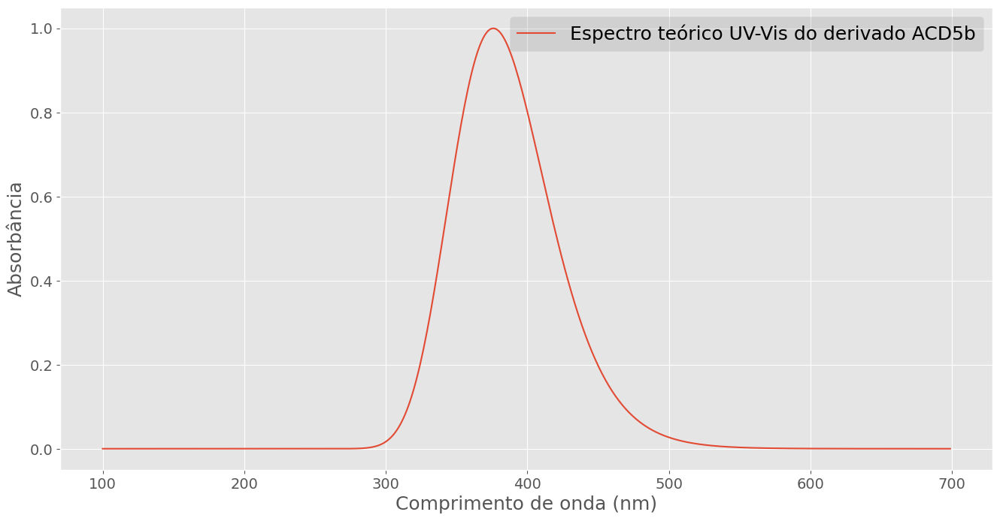

In [ ]:
#@title **Espectro teórico (UV-Vis) da molécula ACD5b**

import matplotlib.pyplot as plt
import pandas as pd

d1 = pd.read_csv('/content/ACD5b_6_311G_dft_freq_11_01_2024_ir.csv', decimal='.')

import matplotlib.pyplot as plt
import numpy as np

%matplotlib inline
plt.style.use('ggplot')

fig = plt.figure(figsize=(16,8))
ax = plt.subplot(111)
#ax.set_xticks(np.arange(150, 420, 20))
#ax.set_yticks(np.arange(0, 1, 0.10))
#ax.grid(which='major', color='#CCCCCC', linestyle='--')
#ax.grid(which='minor', color='#CCCCCC', linestyle='--')
plt.xlim([4000, 0])
plt.ylim([1, -0.1])
plt.plot(d1['X'], d1['Y']/d1['Y'].max(), label='Espectro teórico Infravermelho (IR) da molécula ACD5b', color='green')
#plt.plot(d2['X'], d2['Y']/(d2['Y'].max()), label='Espectro UV-Vis téorico da molecula ACD5b')
# A conversão de epsilon para absorbância requer o uso da Lei de Beer-Lambert, onde A = epsilon (M^{-1} . cm^-1) * l (cm) * c (mol/L)

plt.xlabel('Número de onda ($cm^{-1}$)', fontsize=18)
plt.ylabel('Transmitância', fontsize=18)

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend(facecolor="gray", framealpha=0.2, frameon=True, fontsize=18)
plt.savefig('espectro_teorico_iv_acd5b.png', dpi=300, bbox_inches = 'tight')

import matplotlib.pyplot as plt
import pandas as pd

d1 = pd.read_csv('/content/ACD5b_6_311G_dft_UV_Vis_13_01_2024_uvvis.csv', decimal='.')

import matplotlib.pyplot as plt
import numpy as np

%matplotlib inline
plt.style.use('ggplot')

fig = plt.figure(figsize=(16,8))
ax = plt.subplot(111)
#ax.set_xticks(np.arange(150, 420, 20))
#ax.set_yticks(np.arange(0, 1, 0.10))
#ax.grid(which='major', color='#CCCCCC', linestyle='--')
#ax.grid(which='minor', color='#CCCCCC', linestyle='--')
#plt.xlim([150, 420])
#plt.ylim([0, 1])
plt.plot(d1['X'], d1['Y']/d1['Y'].max(), label='Espectro teórico UV-Vis do derivado ACD5b')
#plt.plot(d2['X'], d2['Y']/(d2['Y'].max()), label='Espectro UV-Vis téorico da molecula ACD5b')
# A conversão de epsilon para absorbância requer o uso da Lei de Beer-Lambert, onde A = epsilon (M^{-1} . cm^-1) * l (cm) * c (mol/L)

plt.xlabel('Comprimento de onda (nm)', fontsize=18)
plt.ylabel('Absorbância', fontsize=18)

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend(facecolor="gray", framealpha=0.2, frameon=True, fontsize=18)
plt.savefig('/home/espectro_teorico_uv_vis_acd5b.png', dpi=300, bbox_inches = 'tight')

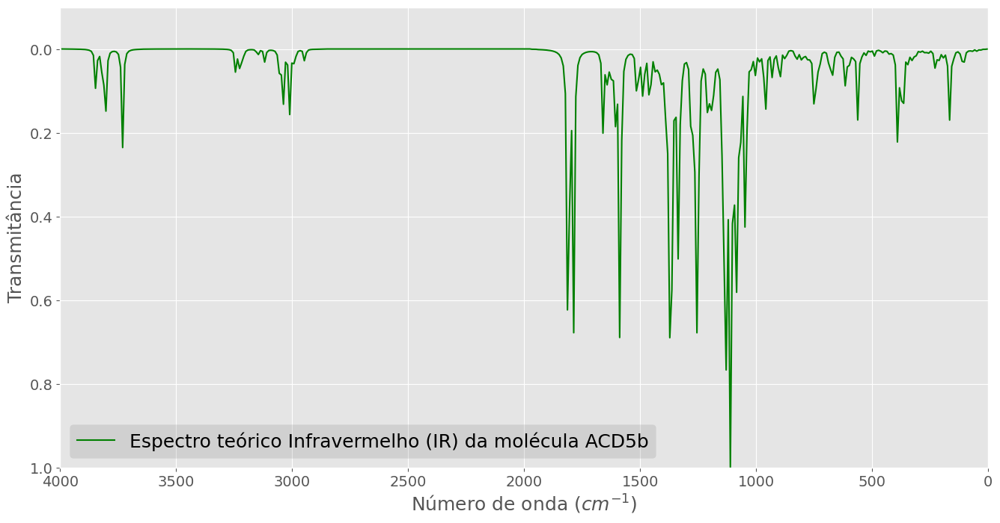

In [ ]:
#@title **Espectro Infravermelho (IV) da molécula ACD5b**

import matplotlib.pyplot as plt
import pandas as pd

d1 = pd.read_csv('/content/ACD5b_6_311G_dft_freq_11_01_2024_ir.csv', decimal='.')

import matplotlib.pyplot as plt
import numpy as np

%matplotlib inline
plt.style.use('ggplot')

fig = plt.figure(figsize=(16,8))
ax = plt.subplot(111)
#ax.set_xticks(np.arange(150, 420, 20))
#ax.set_yticks(np.arange(0, 1, 0.10))
#ax.grid(which='major', color='#CCCCCC', linestyle='--')
#ax.grid(which='minor', color='#CCCCCC', linestyle='--')
plt.xlim([4000, 0])
plt.ylim([1, -0.1])
plt.plot(d1['X'], d1['Y']/d1['Y'].max(), label='Espectro teórico Infravermelho (IR) da molécula ACD5b', color='green')
#plt.plot(d2['X'], d2['Y']/(d2['Y'].max()), label='Espectro UV-Vis téorico da molecula ACD5b')
# A conversão de epsilon para absorbância requer o uso da Lei de Beer-Lambert, onde A = epsilon (M^{-1} . cm^-1) * l (cm) * c (mol/L)

plt.xlabel('Número de onda ($cm^{-1}$)', fontsize=18)
plt.ylabel('Transmitância', fontsize=18)

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend(facecolor="gray", framealpha=0.2, frameon=True, fontsize=18)
plt.savefig('espectro_teorico_iv_acd5b.png', dpi=300, bbox_inches = 'tight')

# Ensaios de agregação plaquetária

/content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/Agregação plaquetária


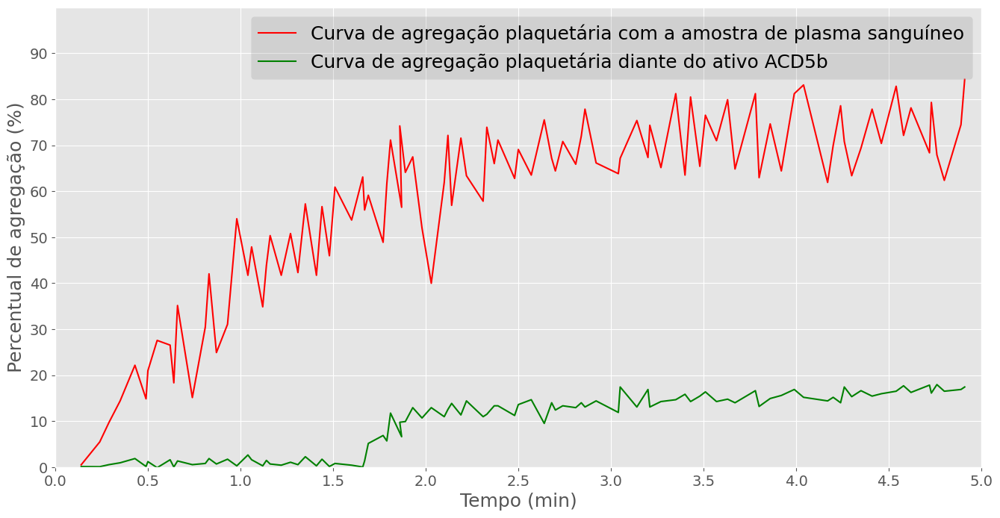

In [ ]:
#@title **Curva de agregação plaquetária para o derivado ACD5b**

import matplotlib.pyplot as plt
import pandas as pd

%cd /content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/Agregação plaquetária/

d1 = pd.read_csv('agregacao_plaquetaria_dados.csv', decimal='.')

import matplotlib.pyplot as plt
import numpy as np

%matplotlib inline
plt.style.use('ggplot')

fig = plt.figure(figsize=(16,8))
ax = plt.subplot(111)
ax.set_xticks(np.arange(0, 5.1, 0.5))
ax.set_yticks(np.arange(0, 100, 10))
#ax.grid(which='major', color='#CCCCCC', linestyle='--')
#ax.grid(which='minor', color='#CCCCCC', linestyle='--')
plt.xlim([0, 5])
plt.ylim([0, 100])
plt.plot(d1['Time_1'], d1['Agregation_plasma'], label='Curva de agregação plaquetária com a amostra de plasma sanguíneo', color='red')
plt.plot(d1['Time_1'], d1['Agregation_acd5b'], label='Curva de agregação plaquetária diante do ativo ACD5b', color='green')
#plt.plot(d2['X'], d2['Y']/(d2['Y'].max()), label='Espectro UV-Vis téorico da molecula ACD5b')
# A conversão de epsilon para absorbância requer o uso da Lei de Beer-Lambert, onde A = epsilon (M^{-1} . cm^-1) * l (cm) * c (mol/L)

plt.xlabel('Tempo (min)', fontsize=18)
plt.ylabel('Percentual de agregação (%)', fontsize=18)

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend(facecolor="gray", framealpha=0.2, frameon=True, fontsize=18)
plt.savefig('curva_agregacao.png', dpi=300, bbox_inches = 'tight')

/content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/Agregação plaquetária


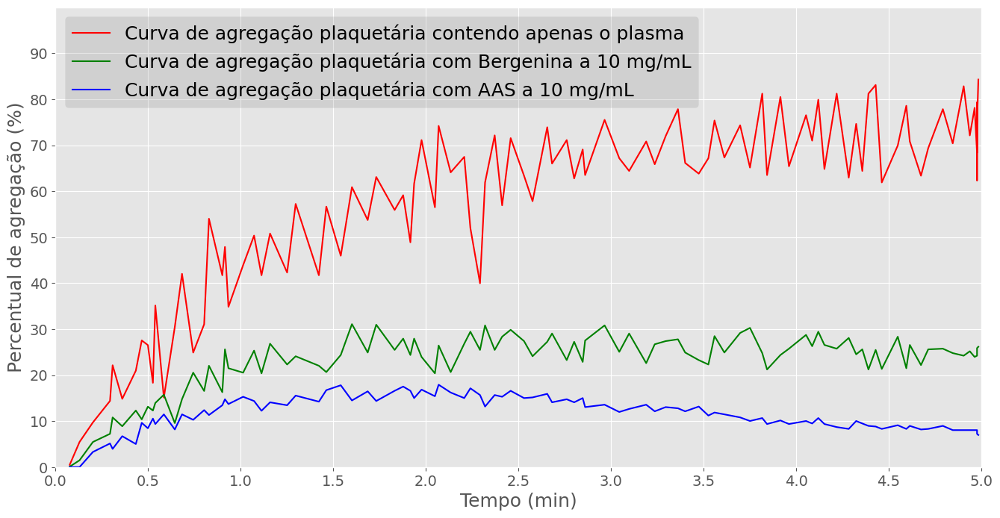

In [ ]:
#@title **Curva de agregação plaquetária para Bergenina**

import matplotlib.pyplot as plt
import pandas as pd

%cd /content/drive/MyDrive/Iniciação Científica/Pibic 2023-2024 (Neuropatia diabética)/Agregação plaquetária/

d1 = pd.read_csv('dados_agregacao_06_07_2023.csv', decimal='.')

import matplotlib.pyplot as plt
import numpy as np

%matplotlib inline
plt.style.use('ggplot')

fig = plt.figure(figsize=(16,8))
ax = plt.subplot(111)
ax.set_xticks(np.arange(0, 5.1, 0.5))
ax.set_yticks(np.arange(0, 100, 10))
#ax.grid(which='major', color='#CCCCCC', linestyle='--')
#ax.grid(which='minor', color='#CCCCCC', linestyle='--')
plt.xlim([0, 5])
plt.ylim([0, 100])
plt.plot(d1['Tempo'], d1['Agregacao_plasma'], label='Curva de agregação plaquetária contendo apenas o plasma', color='red')
plt.plot(d1['Tempo'], d1['Agregacao_bergenina_10mg_ml'], label='Curva de agregação plaquetária com Bergenina a 10 mg/mL', color='green')
plt.plot(d1['Tempo'], d1['Agregacao_AAS_10mg.ml-1'], label='Curva de agregação plaquetária com AAS a 10 mg/mL', color='blue')
#plt.plot(d2['X'], d2['Y']/(d2['Y'].max()), label='Espectro UV-Vis téorico da molecula ACD5b')
# A conversão de epsilon para absorbância requer o uso da Lei de Beer-Lambert, onde A = epsilon (M^{-1} . cm^-1) * l (cm) * c (mol/L)

plt.xlabel('Tempo (min)', fontsize=18)
plt.ylabel('Percentual de agregação (%)', fontsize=18)

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend(facecolor="gray", framealpha=0.2, frameon=True, fontsize=18)
plt.savefig('curva_agregacao_bergenina.png', dpi=300, bbox_inches = 'tight')

#Protocolos de docking molecular no software GOLD v.2023-2

Serial para instalação: DE2CB0-3DA0D9-4E618A-6C2ACD-CB8C58-57C01F

Onde baixa o software GOLD: https://bdec.dotlib.com.br/

É necessário e-mail institucional para o cadastro

#Análises MM-GBSA



In [ ]:
$SCHRODINGER/run thermal_mmgbsa.py  xx-out.cms -j energy-calc -start_frame 4000 -end_frame 8000 -step_size 50 -HOST localhost:8 -NJOBS 8 > output

#Caderno de laboratório e progressos na pesquisa

---
**Dia 15 de junho de 2023**

Inicialmente as coordenadas do sítio de ligação dos receptores estão sendo obtidas pelo AutoDock Tools. Desta forma, primeiramente há a remoção do ligante presente na cristalografia proveniente do Protein Data Bank e depois como se fosse um "receptor", descubro seu centro de massa que será justamente o sítio do receptor. Contudo, ao realizar o cálculo do centro de massa por outras ferramentas integradas ao Python, as coordenadas diferem entre si.

---
**Dia 16 de junho de 2023**

No momento, a etapa de preparação dos receptores e ligantes foi realizada manualmente ao invés de automatizada com scripts em Python.

Na dinâmica molecular, vem sendo possível utilizar o Google Colab a partir dos arquivos de input gerados pelo plugin QwikMD no VMD para dinâmica no NAMD3.

Preciso testar a possibilidade do OpenMM em Python como substituto para todas as minhas simulações de dinâmica molecular.

---
**Dia 20 de junho de 2023**

A utilização do software de dinâmica molecular NAMD3 diretamente no Google Colab embora funcione normalmente, venho sofrendo com a constante desconexão do servidor o que interrompe o cálculo. Mas posso utilizar o código abaixo em JavaScript e inserir a partir do atalho CRTL + SHIFT + I:

function ClickConnect(){
    console.log("Working");
    document.querySelector("colab-toolbar-button#connect").click()
}
setInterval(ClickConnect,60000)

---
**Dia 27 de junho de 2023**

Protocolo de docking I entre a bergenina e a enzima alpha-amilase (PDB ID: 4W93): Considerou-se a presença de co-fatores de Ca+ e Cl+ na enzima, o receptor foi considerado totalmente rígido, e as coordenadas do sítio de ligação foram as mesmas do ligante co-cristalizado Montbretin A. O melhor score foi de -7.454 kcal/mol.

Protocolo de docking II agora considerando o receptor parcialmente flexível:

Nos protocolos de redocking penso que seria melhor considerar as coordenadas do gridbox no centro da macromolécula, ao invés do sítio de ligação previamente conhecido pela cristalografia. Desta forma, dificultaria ainda mais e testaria de fato se o algoritmo encontraria a melhor conformação. Desta forma, as coordenadas do centro de massa da proteína seriam apenas: x = -8.026; y = 21.279; z = -18.984.

Tenho grande receio que ligantes de maior massa molecular e número de átomos possam gerar resultados tendenciosos no docking molecular.

---
**Dia 29 de junho de 2023**

Ao que me parece quando considero o receptor parcialmente flexível, posso tanto favorecer a interação proteína-ligante mas também diminuí-la. Porém, protocolos assim são mais confiáveis, e o que será um diferencial na pesquisa.

---
**Dia 04 de julho de 2023**

Em relação às coordenadas do sítio de ligação para P2Y1 (PDB ID: 4NTJ)

---
**Dia 14 de julho de 2023**

Mesmo com o IP da UFAM, não consigo ter acesso à plataforma Reaxys da Elsevier, pois facilitaria imensamente estudar o mecanismo de reações.

---
**Dia 18 de julho de 2023**

Acredito que otimizar os receptores de cyclodextrin no Gaussian 09W vem tornando os resultados de docking completamente incoerentes, onde os valores de energia livres estão todos em torno de -0.01 kcal/mol.

---
**Dia 19 de julho de 2023**

Minha hipótese é de que as cargas parciais estimadas pelo Gaussian 09 mediante o método semi-empírico PM6 podem ter sido as responsáveis pelos valores de afinidade tão estranhos obtidos, por isso talvez se eu adicionasse as Gasteiger o problema poderia sumir.

---
**Dia 11 de agosto de 2023**

Quando faço a dinâmica molecular a partir da nuvem do Google Colab, me pergunto se de fato está sendo utilizada a GPU. Porém, ao ver o .log do NAMD percebe-se que ele identificou a GPU Nvidia Tesla, logo, está usando o máximo do poder de processamento.

---
**Dia 14 de agosto de 2023**

É imprescindível que antes de ser gerado a topologia de um ligante pelo CGenFF sejam adicionados todos os átomos de Hidrogênio, para evitar que hajam erros de conectividade. Uma

**Dia 21 de setembro de 2023**

Infelizmente é bem difícil encontrar um padrão nos resultados de docking molecular, já que na maioria das vezes não necessariamente quando se aumenta o gridbox ou espaço de busca conformações mais favoráveis de energia livre serão obtidas. Em alguns casos, existe um aumento enquanto em outros um decréscimo.

**Dia 22 de setembro de 2023**

-Tranformar em .pdbqt a estrutura já otimizada da ACD51

**Dia 28 de agosto de 2023**

Um site excelente com inúmeros tutoriais em bioinformática, incluindo docking e dinâmica molecular.
https://bioinformaticsreview.com/

---
**Dia 26 de setembro de 2023**
Conseguiu-se finalizar as simulações com a 4-methoxi-chalcona na interação com os receptores P2X3 (PDB ID: 5SVR), além da via P2Y12 (PDB ID: 4NTJ) onde ao aumentar o tamanho da caixa de busca ou gridbox, observou-se um aumento na afinidade obtida para a melhor conformação, havendo um salto de -5.975 kcal/mol para -6.586 kcal/mol na interação com P2Y12. Por outro lado, na via P2X3 a diferença foi muito sutil, se alterando de -6.308 kcal/mol para -6.311 kcal/mol

---
**Dia 10 de novembro de 2023**

A nomenclatura correta é o 3-dinitrobenzoyl.

A purificação é feitas antes de ir para o HPLC, pois o CCD faz uma análise apenas qualitativa.

3-dinitrobenzoyl --> ACD5B (FitoPhar)

O que possui o grupo aldeído é o ACD50c

Foi feito uma coleta sanguínea usando o Tubo Azul - Citrato de Sòdio, para os testes de agregação plaquetária.

O objetivo é construir um gráfico dose-resposta com as diferentes concentrações do ativo.

396 \mu L de PRP e PPP + 4 \mu L de DMSO.

PRP - Turvo
PPP - Límpido

Acompanhar a curva de agregação por 5 minutos.

Cláudio - Malária - Dissertação

O ADP é o agonista.

A média de agregação foi de 54% sem o ativo ou AAS (Paciente: Micael Oliveira)

São 2 minutos de incubação

O AAS gerou uma diminuição para 50%

Diluir em 100 \mu L, para atingir a concentração de

25 \mu g / L foi a concentração dos ativos

Com o ACD5b houve uma diminuição para 43%

Testar o ativo numa concentração mais alta ao menos 10 mg/mL

A bergenina (padrão) apresnetou 48%

---
**Dia 21 de novembro de 2023**

Primeiramente foi medido a massa de 1 mg / 0,0010 g dos ativos, acd5b, 50c( aldeído), e bergenina

Vejo algo inusitado, os eppendorfs ou microtubos diferem um pouco na massa um para o outro mesmo estando vazios.

Tubo 1: 0,8112 g
Tubo 2: 0,7922 g

No uso do HPLC é fundamental que a pressão não ultrapasse a pressão de 100-150 kgF, para não danificar a coluna cromatográfica.

---
**Dia 28 de novembro de 2023**

A Bergenina (Padrão) foi diluída em 1 mg/mL em Methanol. Pesou-se 1,51 mg de bergenina na balança analítica.

É preciso aguardar até que estabilize o plot do PDA.

A amostra foi colocada no vial com posição 04.

Os comprimentos de onda monitorados foram 215 nm,

---
**Dia 12 de Dezembro de 2023***

Ao analisar os resultados de docking molecular vi que infelizmente cometi um erro, pois esqueci de deletar o ligante co-cristalizado AZJ do receptor P2Y12 (PDB ID: 4NTJ) o que certamente comprometeu todos os resultados quando considerou-se

---
***Dia 21 de Dezembro de 2023***

Pude finalmente fazer o docking molecular da ACD5b (dinitrobenzoil bergenina) já otimizada a nivel da teoria DFT, com o receptor rígido P2Y12. Nisto, a melhor afinidade obtida foi de -8.418 kcal/mol.

Em todos os dockings onde o receptor foi considerado parcialmente flexível notei algo preocupante. Isto porque, os resultados de afinidade estão aparecendo sob um aminoácido e não ao ligante com o qual está sendo feito o docking. Consequentemente, todos os valores de docking podem estar inconsistente. Preciso encontrar alguma forma de corrigir tudo isso.

Nos ensaios de agregação plaquetária, ao deixar o sangue venoso coletado por 2 dias na geladeira notou-se que houve a separação dos componentes do sangue em plasma mesmo sem ter passado pela centrífuga. Contudo, é conhecido nos protocolos de manuseio de plaquetas que estas foram todas comprometidas já que a temperatura ideal seria de 20ºC - 25ºC, e se possível incubado em 37ºC, além de no máximo 3 horas. Consequentemente as fazer as análises percebeu-se um aspecto completamente límpído, provavelmente devido à ausência de plaquetas o que impossibilitou qualquer análise.

*** Dia 26 de Dezembro de 2023***

No artigo do Hemoam do teste de agregação plaquetária a concentração do ADP foi de 7 µg/mL, enquanto os volumes de PRP e PPP foram de 400 µL.

---
**Dia 27 de Dezembro de 2023**

A dinâmica molecular do complexo ACD5b com o receptor P2Y12 infelizmente apresentou resultados incosistentes quando à análise de RMSD, apresentando pico completamente instáveis. Até hoje não sei as causas desse problema, por isso acabo preferindo simular adotando o NAMD/VMD.

De qualquer modo a conversão do formato .mpeg para .mp4 se dá pelo comando:

    sudo apt install ffmpeg

    ffmpeg -i 5svr_P2X3_complex_AC5b_100ns_md.mpeg -filter:v "setpts=0.8*PTS" 5svr_P2X3_complex_AC5b_100ns_md.mp4


---
**Dia 08 de Janeiro de 2024**

O docking considerando o receptor parcialmente flexível apresenta infozmente inconsistências na afinidade. O algoritmo acaba vendo um dos aminoácidos flexíveis como ligante.

---
**Dia 15 de Janeiro de 2024**

Cheguei a conclusão de que a alta instabilidade nas simulações de dinâmica molecular pode ter sido resultante do docking parcialmente flexível. Desde já, venho adotando o receptor como rígido e apenas o ligante de forma flexível, assim como sempre adotei nos anos anteriores.

---
**Dia 19 de Janeiro de 2024**

-Comprar mais papel adesivo para o BioPhar.

**Dia 23 de Janeiro de 2024**

Parece estar havendo um erro com a reprodutibilidade do experimento.

Tempo de retenção para 1 mg/ml de ACD5b no dia 23/01/2024 --> 5,4 minutos
Tempo de retenção para 1 mg/ml de ACD5b no dia --> 8,75 minutos

Vem sendo muito perceptível que a Bergenina (padrão) apresenta um sinal muito alto em torno de 1000 mAU.

Na mistura o tempo de retenção da ACD5b foi em 4,25 minutos

**Dia 12 de fevereiro de 2024**
Utilizar outra sinalização da via purinérgica P2Y para efetuar o docking molecualr rígido e prosseguir para dinâmica molecular.

Ao preparar o ligante pelo CGenFF, apenas o formato .mol2 conserva o tipo de ligação de forma correta.

A visualização de superfície no Maestro para os resultados do docking se mostra melhor quando a superfície fica com 40% de transparência.

Finalmente conseguir gerar uma topologia do ligante sem que houvesse distorções na preparação da dinâmica molecular para o NAMD. Etapas para conseguir:

  1. Adicionar todos os Hidrogênios explícitos com auxílio do Chimera e sempre salvar em .mol2.
  2. Enviar arquivo .mol2 para a plataforma atualizada CGenFF (https://app.cgenff.com/login)
  3. Ao realizar o download dos resultados, fazer a união do arquivo .mol2 + receptor em .pdb usando o Maestro. É fundamental que se mantenha em .mol2 para o ligante para não haver distorções na molécula.
  4. Ao fim, carregar o complexo em .pdf no módulo QwikMD e carregar a topologia do ligante para que seja reconhecido pelo NAMD.


---
**Dia 17 de Fevereiro de 2024**

Dentre as ferramentas que posso utilizar para comprimir um .pdf e reduzir seu tamanho para enviar no ecampus, e que também apresentaram melhor qualidade proporcional ao tamanho foram: Online2PDF e PDF24

---
**Dia 23 de Fevereiro de 2024**

-Colocar Objetivos Gerais e Específicos nos slides.

---
**Dia 23 de Abril de 2024**

-Estou preocupado em misturar resultados do docking rígido com o flexível. Na última vez o docking flexível estava dando afinidade para um aminoácido, ao invés do ligante em si.


# Escrita do artigo científico

O Fabiano sugeriu